# Setting

## Library

In [1]:
import pandas as pd
import numpy as np
import math

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
import random
import os
from tqdm.notebook import tqdm

In [59]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [5]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score # 정확도
from sklearn.metrics import precision_score # 정밀도
from sklearn.metrics import recall_score # 재현율
from sklearn.metrics import f1_score # F1-Score
from sklearn.metrics import confusion_matrix

## Seed

In [6]:
def my_seed_everywhere(seed):
    random.seed(seed) # random
    np.random.seed(seed) # numpy
    os.environ["PYTHONHASHSEED"] = str(seed) # os
    print(f'고정된 Seed : {seed}')

In [7]:
my_seed_everywhere(42)

고정된 Seed : 42


# Data Set

In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
path_file = '/content/drive/MyDrive/UNIST/AICP/data/dynmom_dat.csv'

DATA = pd.read_csv(path_file)

# Preprocessing

In [10]:
def preprocessing(data, used=None):
  # 'DATE'를 칼럼 대신 인덱스로 사용
  data.index = data['DATE']
  data = data.drop(columns='DATE')
  print("'DATE'를 칼럼 대신 인덱스로 사용")

  # 결측치 제거 및 모델 학습에 불필요한 칼럼 제거
  data = data.dropna()
  data = data.drop(columns=['winner', 'loser', 'form_date'])
  print("결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')")

  if used != None:
    D = ', '.join(used)
    used += ['wml']
    data = data[used]
    print(f"훈련에 사용되는 변수 들 : {D}")

  return data

In [11]:
case4 = ['mvol_cum6', 'cum_winner_t_2_4', 'cum_winner_t_5_8', 'cum_winner_t_9_12', 'cum_loser']
case_name = 'CASE_4'
df = preprocessing(DATA, used=case4)

'DATE'를 칼럼 대신 인덱스로 사용
결측치 제거 및 모델 학습에 불필요한 칼럼 제거 ('winner', 'loser', 'form_date')
훈련에 사용되는 변수 들 : mvol_cum6, cum_winner_t_2_4, cum_winner_t_5_8, cum_winner_t_9_12, cum_loser


In [12]:
def normal_wml(df):
  print("'wml'이 양수면 1 & 음수면 0")
  print("Output : 'Preprocessed_Data' & 'WML'")
  print()

  cond_wml = (df['wml']>=0)
  df.loc[cond_wml, 'pos_wml'] = 1
  df.loc[~cond_wml, 'pos_wml'] = 0

  POS_WML = df['pos_wml'].value_counts()
  print(f'Ratio : {POS_WML[0]/POS_WML[1]}')
  print(POS_WML)

  return df

In [13]:
dynmom = normal_wml(df)

'wml'이 양수면 1 & 음수면 0
Output : 'Preprocessed_Data' & 'WML'

Ratio : 0.5634379263301501
1.0    733
0.0    413
Name: pos_wml, dtype: int64


# Modeling

In [14]:
def Roling_Windows(data, window_size, method, model):

  # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
  result_dict = {
      'TRAIN_START_DATE':[], # 훈련 데이터 시작 지점
      'TRAIN_END_DATE':[], # 훈련 데이터 마지막 지점
      'TEST_DATE':[], # 테스트 데이터 지점
      'wml':[], # wml 값
      'dynamic_momentum':[], # 다이나믹 모멘텀 값
      'Actual_POS_WML':[], # 실제 Target 값 (0 or 1)
      'dynamic_leverage':[], # 추론된 Target 확률값
      'static_leverage':[], # 추론된 Target 값 (0 or 1)
  }

  df_feature = pd.DataFrame()

  # 모델 학습이 종료되는 지점 설정
  end = data.shape[0] - window_size

  print('*'*50)
  print('설정된 Model의 하이퍼파리미터 : \n')
  for p, v in zip(model.get_params(deep=True).keys(), model.get_params(deep=True).values()):
    print(f'   {p} : {v}')
  print()
  print('*'*50)

  for i in tqdm(range(end)):

    # 모델 학습 중지
    if i == end:
      print('Prediction using machine learning has ended.')
      break
    
    # Rolling Fixed Window
    if method == 'Fixed':
      MODEL = model
      train = data.iloc[0+i:window_size+i]

    # Rolling Expanding Window
    elif method == 'Expanding':
      MODEL = model
      train = data.iloc[0:window_size+i]
    
    # 'method' 잘못입력한 경우
    else:
      print("Make sure to set the method to either 'Fixed' or 'Expanding'.")
      break
    
    # 테스트 데이터 설정
    test = data.iloc[[window_size+i]]

    # Features와 Target 구분
    X_train = train.drop(columns=['pos_wml', 'wml'])
    y_train = train['pos_wml']

    X_test = test.drop(columns=['pos_wml', 'wml'])
    y_test = test['pos_wml'] 

    wml_test = list(test['wml'])

    # 모델 학습 및 추론
    MODEL.fit(X_train, y_train)
    pred_test = MODEL.predict(X_test)
    prob_test = MODEL.predict_proba(X_test)

    # 학습 및 테스트 데이터 정보 & 실제값과 예측값 정보 수집
    result_dict['TRAIN_START_DATE'].append(train.index[0])
    result_dict['TRAIN_END_DATE'].append(train.index[-1])
    result_dict['TEST_DATE'].append(test.index[0])

    result_dict['wml'].append(wml_test[0])

    dynamic_momentum = prob_test[0][-1] * wml_test[0]
    result_dict['dynamic_momentum'].append(dynamic_momentum)

    result_dict['Actual_POS_WML'].append(list(y_test)[0])
    result_dict['static_leverage'].append(pred_test[0])
    result_dict['dynamic_leverage'].append(prob_test[0][-1])

    # 트리 기반 모델 (사이킷런)의 Feature Importance 정보 수집
    feature_importances = MODEL.feature_importances_
    df_ft_importance = pd.DataFrame(feature_importances, index = X_train.columns).T
    df_ft_importance.index = y_test.index
    df_feature = pd.concat([df_feature, df_ft_importance])

  result = pd.DataFrame(result_dict)
  result.index = df_feature.index

  result = pd.concat([result, df_feature], axis=1)
  result = result.set_index('TEST_DATE')
  
  # 학습 및 테스트 데이터 정보, 실제값과 예측값 정보, 변수 중요도 정보
  return result

In [15]:
def plot_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  
  plt.show()

In [16]:
def plot_feature_importances(data):

  data = data.drop(columns=['TRAIN_START_DATE', 'TRAIN_END_DATE', 'Actual_POS_WML',
                           'static_leverage', 'dynamic_leverage', 'cum_return',
                           'dynamic_momentum', 'wml'])

  print('\nFeature Importance of the model\n')

  # 날짜 별 Feature Importance 변화 추이
  plt.figure(figsize=(15, 5))
  for col in data.columns:

    sns.lineplot(data=data,
                x=data.index,
                y=col,
                label=col,
                alpha=0.3)
    
    plt.title('Feature importances using MDI')
    plt.xlabel('DATE')
    plt.ylabel('Mean decrease in impurity')
    plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=5,
                      width=0.1)
  plt.show()

  # 각 변수 별 Feature Importance 통계값
  MEAN = display_feature_importance(data, method='mean')
  MAX = display_feature_importance(data, method='max')
  MIN = display_feature_importance(data, method='min')

  plt.figure(figsize=(15, 5))
  sns.barplot(data=MEAN,
              y=MEAN.index,
              x='mean_Feature_Importance')

  plt.show()
  print()

  FEATURE_IMPORTANCE = pd.concat([MEAN, MAX, MIN], axis=1)
  display(FEATURE_IMPORTANCE)

In [17]:
def display_feature_importance(data, method):
       
    feature_dict = {}
    for col in data.columns:
      if method=='mean':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].mean())

      if method=='max':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].max())
      
      if method=='min':
        feature_dict[col]=[]
        feature_dict[col].append(data[col].min())
    
    feature_df = pd.DataFrame(feature_dict).T
    feature_df.columns = [method+'_'+'Feature_Importance']
    feature_df=feature_df.sort_values(by=method+'_'+'Feature_Importance', ascending=False)

    return feature_df

In [18]:
def slice_feature_importance(data, num):

  if type(num) != bool:
    division = int(data.shape[0]/num)
    
    for i in range(num):

      if i == num-1:
        sliced_data = data.iloc[i*division:]

      else:
        sliced_data = data.iloc[i*division:(i+1)*division]

      start = sliced_data.index[0]
      end = sliced_data.index[-1]

      print()
      print('*'*50)
      print(f'\nDATE : {start} ~ {end}\n')
      print('*'*50)
      print()
      
      plot_result(sliced_data)
      plot_feature_importances(sliced_data)
  
  else:
    start = input('Start Date (ex: 20200131): ')
    end = input('Start Date (ex: 20221230): ')
    print('*'*50)
    print(f'\nDate : {start} ~ {end}\n')
    print('*'*50)
    print()

    sliced_data = data.loc[start:end]
    plot_result(sliced_data)
    plot_feature_importances(sliced_data)

In [19]:
def cum_return_sharpe_ratio(data, dynamic=True):

  if dynamic == True:
    weight = 'dynamic_leverage'
  else:
    weight = 'static_leverage'

  # 머신러닝 적용되지 않은 경우 Sharpe Ratio
  w_S = (data['wml'].mean()/data['wml'].std()) * math.sqrt(12)
  print('ORG Sharpe Ratio : {}'.format(w_S))

  # 머신러닝 적용된 경우 Sharpe Ratio
  S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
  print('ML Sharpe Ratio : {}\n'.format(S))
  
  # 머신러닝 적용된 경우 누적 수익률
  data['cum_return'] = (1 + data.dynamic_momentum).cumprod() - 1 

  print('\n최근 누적 수익률\n')
  latly_10 = data[['cum_return']].sort_index(ascending=False).head(5)
  for i, r in zip(latly_10.index, latly_10['cum_return']):
    i = str(i)
    print('  {}년-{}월 -> {:0.2f}'.format(i[:4], i[4:6], r))

  print('\n누적 수익률 가장 높았던 순간 Top 10\n')
  top_10 = data[['cum_return']].sort_values(by='cum_return', ascending=False).head(10)
  rank = 1
  for i, r in zip(top_10.index, top_10['cum_return']):
    i = str(i)
    print('  {}등 : {}년-{}월 -> {:0.2f}'.format(rank, i[:4], i[4:6], r))
    rank += 1
  print()

  # 머신러닝 적용되지 않은 경우 누적 수익률
  without_machine = pd.DataFrame(data['wml'])
  without_machine['wml'] = (1 + without_machine.wml).cumprod() - 1
  without_machine.columns = ['cum_return'] 

  # 머신러닝 여부에 따른 누적 수익률 비교
  plt.figure(figsize=(13, 6))
  sns.lineplot(data=data, x=data.index, y=data['cum_return'], label='With_ML')
  sns.lineplot(data=without_machine, x=without_machine.index, y=without_machine['cum_return'], label='Original')
  plt.xticks([data.index[i] for i in range(0,len(data.index), 12)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=5,
                  width=5)
  
  plt.show()

In [20]:
def statistic_information(data, col):
  statistic = data[[col]].describe().T
  statistic['var'] = data[col].var()
  statistic['1%'] = data[col].quantile(0.01)
  statistic['99%'] = data[col].quantile(0.99)

  statistic = statistic[['count', 'mean', 'var', 'std',
                         'min', '1%', '25%', '50%',
                         '75%',  '99%', 'max']]

  return statistic

def plot_predict_result(data):
  print('\nPerformance results of the model\n')

  # Confusion Matrix & etc
  print(classification_report(data['Actual_POS_WML'], data['static_leverage']))

  # Accuracy, Precision, Recall, F1 Score
  accuracy = accuracy_score(data['Actual_POS_WML'], data['static_leverage'])
  precision = precision_score(data['Actual_POS_WML'], data['static_leverage'])
  recall = recall_score(data['Actual_POS_WML'], data['static_leverage'])
  F1_score = f1_score(data['Actual_POS_WML'], data['static_leverage'])

  print(f'\naccuracy : {accuracy}')
  print(f'\nprecision : {precision}')
  print(f'\nrecall : {recall}')
  print(f'\nF1-Score : {F1_score}\n')
  
  # Visualization Confusion Matrix
  confusion = confusion_matrix(data['Actual_POS_WML'], data['static_leverage'])
  sns.heatmap(confusion, annot=True, fmt='g')
  plt.title(f'Confusion Matrix')
  
  plt.show()

  # ACTUAL = PRED = 1
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 1\n')

  plt.title('WML in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)


  print()
  print('-'*80)
  print()

  # ACTUAL = PRED = 0
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = PRED = 0\n')

  plt.title('WML in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 0 & PRED = 1
  cond = (data['Actual_POS_WML'] == 0) & (data['static_leverage'] == 1)
  cond_data = data.loc[cond]
  print('\nACTUAL = 0 & PRED = 1\n')

  plt.title('WML in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 0 & PRED = 1')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

  print()
  print('-'*80)
  print()

  # ACTUAL = 1 & PRED = 0
  cond = (data['Actual_POS_WML'] == 1) & (data['static_leverage'] == 0)
  cond_data = data.loc[cond]
  print('\nACTUAL = 1 &  PRED = 0\n')

  plt.title('WML in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='wml')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'wml')
  display(info)

  print()
  
  plt.title('Dynamic Momentum in ACTUAL = 1 & PRED = 0')
  sns.barplot(data=cond_data.sort_values(by='wml', ascending=True),
              x=cond_data.index,
              y='dynamic_momentum')
  plt.tick_params(
    axis='x',          
    which='both',      
    bottom=False,      
    top=False,        
    labelbottom=False)
  plt.show()
  info = statistic_information(cond_data, 'dynamic_momentum')
  display(info)

In [21]:
def plot_dynamic_momentum(data):

  print('\nTop 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=False).head(5))

  print('\nBottom 5 dyn_mom\n')
  display(data.sort_values(by='dynamic_momentum', ascending=True).head(5))
  print()

  plt.figure(figsize=(13,8))
  plt.title('Histogram of Dynamic Momentum')
  sns.histplot(data=data, x='dynamic_momentum', kde=True)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Line Plot of Dynamic Momentum')
  sns.lineplot(data=data, x=data.index, y='dynamic_momentum', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=13,
                  width=5)
  plt.show()
  print()

  plt.figure(figsize=(13,8))
  plt.title('Dynamic Leverage vs. WML')
  sns.lineplot(data=data, x=data.index, y='dynamic_leverage', label='Dynamic Leverage', marker='o', markersize=5 ,linewidth=0.5)
  sns.lineplot(data=data, x=data.index, y='wml', label='WML', marker='o', markersize=5 ,linewidth=0.5)
  plt.xticks([data.index[i] for i in range(0, len(data.index), 36)],
             labels=[str(data.index[i])[:4] for i in range(0, len(data.index), 36)])
  plt.tick_params(axis='x',
                  direction='out',
                  labelrotation=45,
                  length=1,
                  pad=10,
                  labelsize=2,
                  width=5)
  plt.legend()
  plt.show()

In [22]:
def leverage_save(result, DATA):
  DATA.index.name = 'TEST_DATE'
  start_index = Fixed_RDF_Result.index[0]
  DATA = DATA.loc[start_index:]
  DATA = DATA.drop(columns=['DATE', 'wml'])
  result = result[['TRAIN_START_DATE', 'TRAIN_END_DATE','wml',
                   'dynamic_momentum', 'Actual_POS_WML',
                   'dynamic_leverage', 'static_leverage']]
  SAVE = pd.concat([result, DATA], axis=1)
  SAVE.index = SAVE.index.astype(str)
  plot_save = SAVE.copy()
  plot_save['dynamic_leverage_100'] = plot_save['dynamic_leverage'].apply(lambda x : x/100)
  plot_save['dynamic_leverage_10'] = plot_save['dynamic_leverage'].apply(lambda x : x*10)

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(/100) VS volatility of Momentum')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_100', label='dynamic_leverage', alpha=0.4)
  for mv in ['mvol_cum6', 'mvol_t_1', 'mvol_t_2',
             'mvol_t_3', 'mvol_t_4', 'mvol_t_5', 'mvol_t_6']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage(*10) VS winner')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage_10', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_winner', 'cum_winner_t_2_4',
             'cum_winner_t_5_8', 'cum_winner_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()
  print()

  plt.figure(figsize=(14, 10))
  plt.title('dynamic_leverage VS loser')
  sns.lineplot(data=plot_save, x=SAVE.index, y='dynamic_leverage', label='dynamic_leverage', alpha=0.4)
  for mv in ['cum_loser', 'cum_loser_t_2_4',
             'cum_loser_t_5_8', 'cum_loser_t_9_12']:

             sns.lineplot(data=plot_save, x=SAVE.index, y=mv, label=mv, alpha=0.5)    
  plt.legend()
  plt.xticks([plot_save.index[i] for i in range(0, len(plot_save.index), 36)],
              labels=[str(plot_save.index[i])[:4] for i in range(0, len(plot_save.index), 36)])
  plt.tick_params(axis='x',
                direction='out',
                labelrotation=45,
                length=1,
                pad=10,
                labelsize=10,
                width=5)
  plt.ylabel('')
  plt.show()

  return SAVE

## Random Forest

In [23]:
RDF_Param={} 
RDF = RandomForestClassifier(**RDF_Param, random_state=42)

In [24]:
Fixed_RDF_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=RDF) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   bootstrap : True
   ccp_alpha : 0.0
   class_weight : None
   criterion : gini
   max_depth : None
   max_features : sqrt
   max_leaf_nodes : None
   max_samples : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_jobs : None
   oob_score : False
   random_state : 42
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7456607133351562


최근 누적 수익률

  2022년-12월 -> 5279.82
  2022년-11월 -> 4907.59
  2022년-10월 -> 4768.16
  2022년-09월 -> 4336.27
  2022년-08월 -> 4071.73

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 5473.77
  2등 : 2022년-12월 -> 5279.82
  3등 : 2008년-11월 -> 5098.37
  4등 : 2008년-06월 -> 5077.29
  5등 : 2009년-01월 -> 5068.32
  6등 : 2008년-12월 -> 5024.74
  7등 : 2002년-09월 -> 5017.37
  8등 : 2008년-10월 -> 4954.76
  9등 : 2022년-11월 -> 4907.59
  10등 : 2022년-10월 -> 4768.16



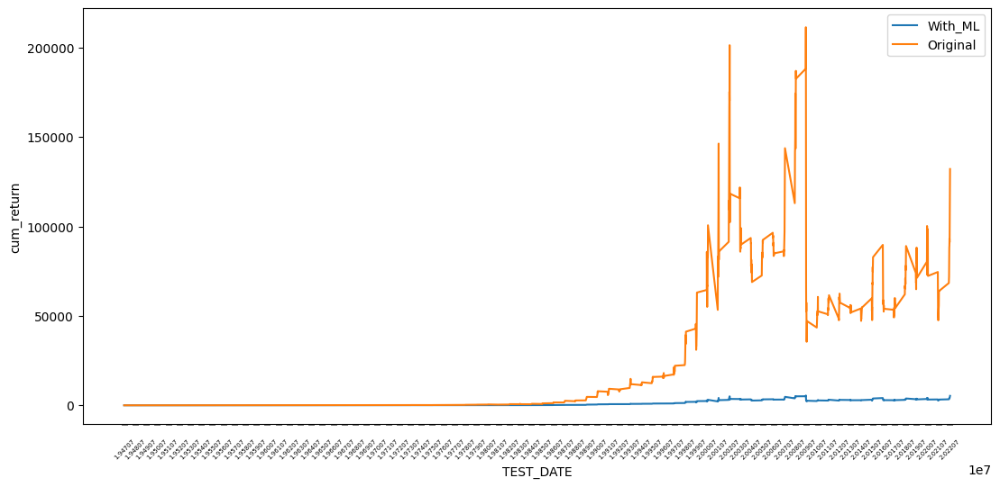

In [25]:
cum_return_sharpe_ratio(data=Fixed_RDF_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.22      0.28       316
         1.0       0.66      0.80      0.72       590

    accuracy                           0.60       906
   macro avg       0.51      0.51      0.50       906
weighted avg       0.56      0.60      0.57       906


accuracy : 0.5960264900662252

precision : 0.6564245810055865

recall : 0.7966101694915254

F1-Score : 0.7197549770290964



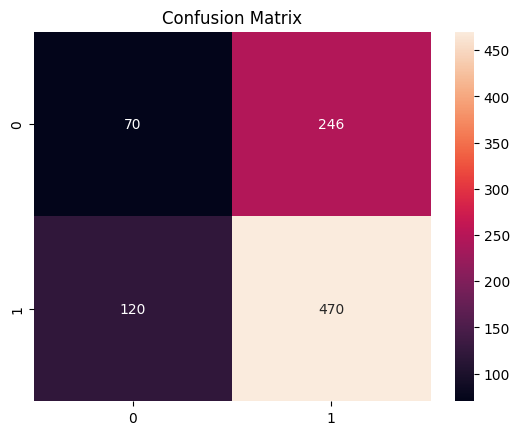


ACTUAL = PRED = 1



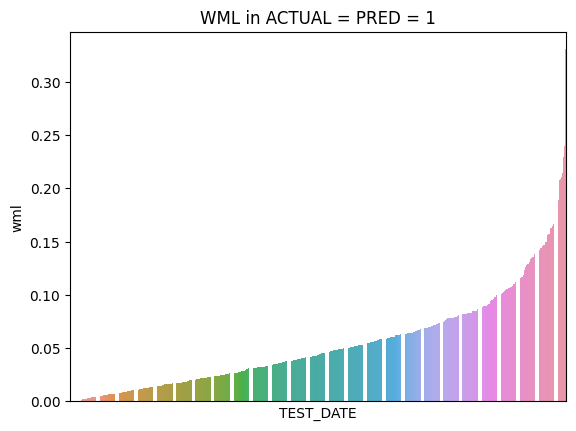

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,470.0,0.054037,0.002071,0.045513,0.000007,0.000679,0.020499,0.043612,0.074314,0.209403,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,470.0,0.038668,0.001046,0.032335,0.000004,0.000495,0.013586,0.030185,0.055477,0.14264,0.178721



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



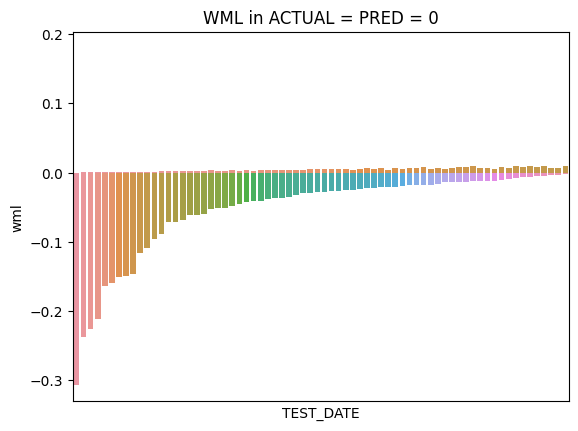

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,70.0,-0.053216,0.003918,0.062593,-0.30599,-0.258452,-0.060828,-0.028494,-0.014439,-0.002767,-0.00241


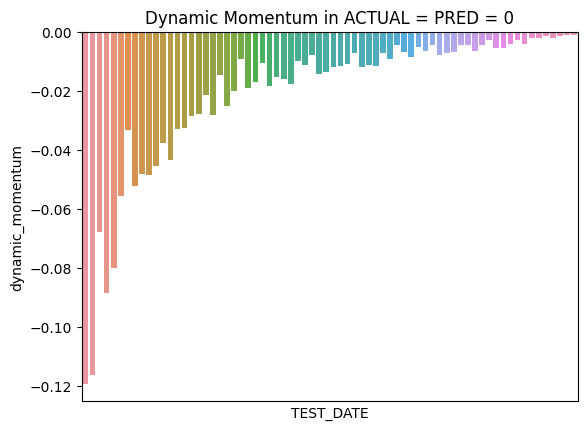

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,70.0,-0.020776,0.000636,0.025215,-0.119336,-0.117156,-0.027128,-0.011252,-0.005573,-0.001048,-0.001036



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



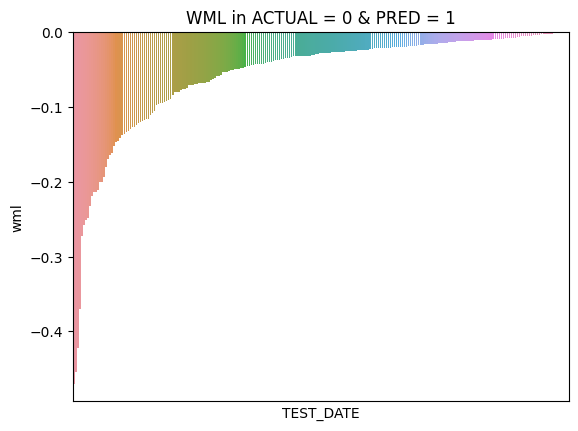

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,246.0,-0.057192,0.005417,0.073603,-0.469903,-0.398838,-0.069333,-0.02865,-0.014757,-0.000709,-0.000132


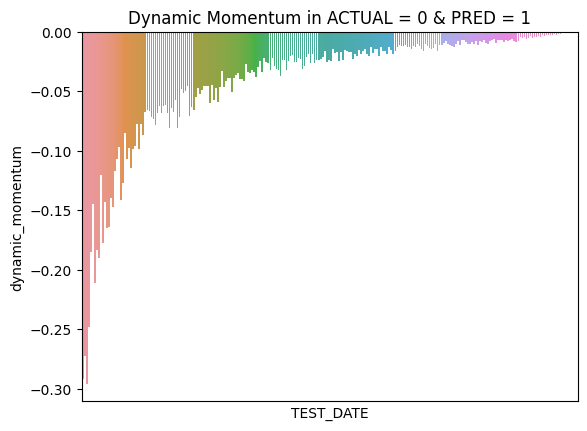

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,246.0,-0.039616,0.002537,0.050365,-0.29568,-0.261502,-0.047881,-0.020519,-0.01042,-0.000464,-0.000091



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



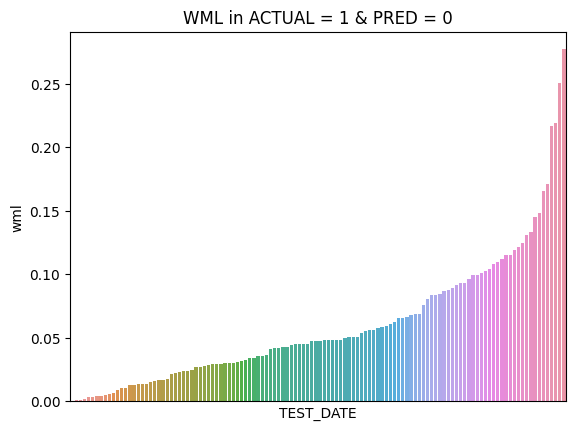

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,120.0,0.060002,0.002654,0.051513,0.000627,0.001203,0.026439,0.047731,0.084887,0.244254,0.276912


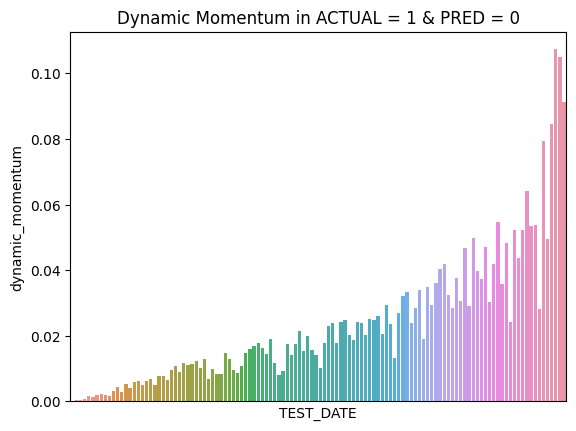

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,120.0,0.023584,0.000436,0.020872,0.000219,0.000356,0.009265,0.017829,0.031033,0.102472,0.107316


In [26]:
plot_predict_result(Fixed_RDF_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20200331,20000331,20200228,0.229130,0.178721,1.0,0.78,1.0,0.192250,0.196905,0.196792,0.201719,0.212334,4160.740387
20000229,19800229,20000131,0.330163,0.178288,1.0,0.54,1.0,0.215462,0.214990,0.175315,0.182616,0.211617,2807.229216
20010928,19810930,20010831,0.207369,0.176264,1.0,0.85,1.0,0.201562,0.234177,0.172531,0.197078,0.194651,4135.239599
20020430,19820430,20020328,0.210220,0.153461,1.0,0.73,1.0,0.201728,0.208164,0.180455,0.200096,0.209557,3753.286265
19991231,19791231,19991130,0.239571,0.143743,1.0,0.60,1.0,0.222481,0.222632,0.153443,0.184561,0.216883,2352.397136



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20090331,19890331,20090227,-0.422400,-0.295680,0.0,0.70,1.0,0.172461,0.215486,0.203262,0.208457,0.200334,3854.991585
20010131,19810130,20001229,-0.469903,-0.291340,0.0,0.62,1.0,0.204058,0.216301,0.169750,0.184826,0.225065,2175.554095
20090430,19890428,20090331,-0.454349,-0.272609,0.0,0.60,1.0,0.172865,0.206616,0.208665,0.223626,0.188229,2803.811804
20021129,19821130,20021031,-0.370041,-0.247927,0.0,0.67,1.0,0.203092,0.226030,0.178627,0.185808,0.206444,3219.159684
20011031,19811030,20010928,-0.250756,-0.210635,0.0,0.84,1.0,0.215991,0.215405,0.175267,0.192336,0.201001,3264.001477


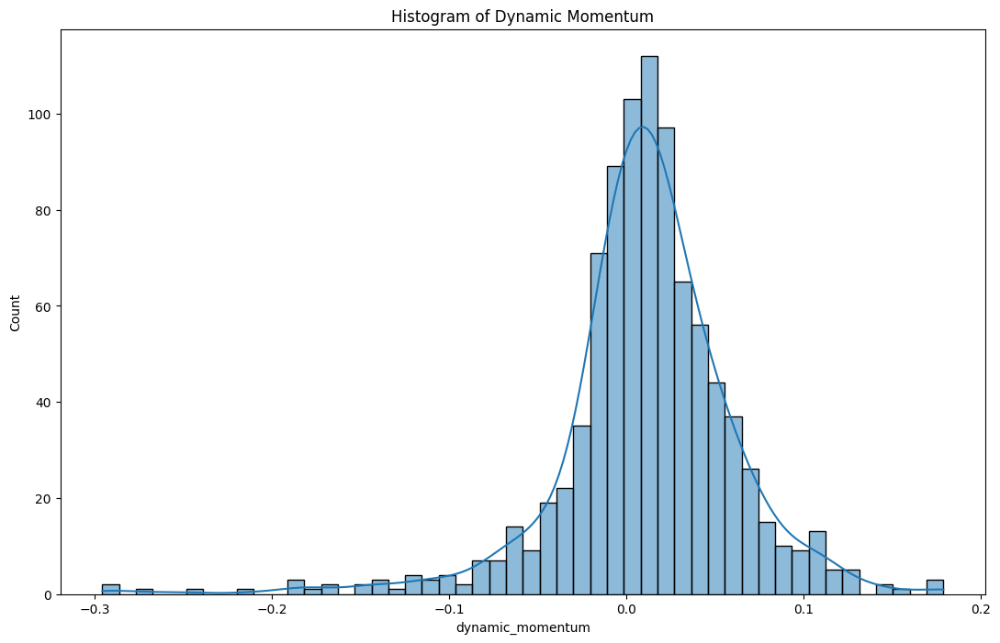

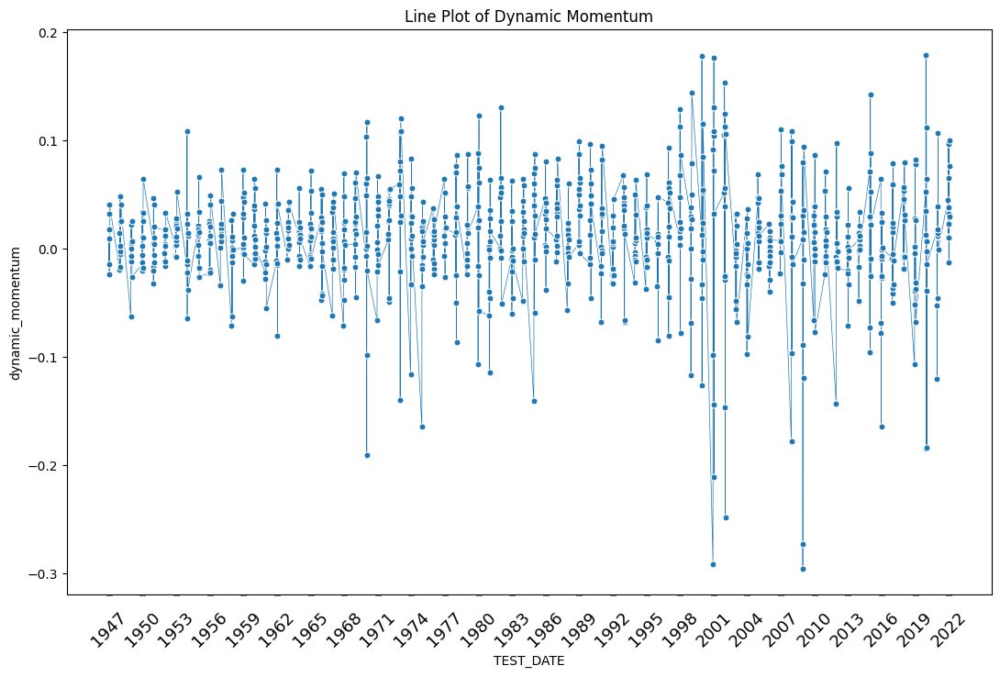

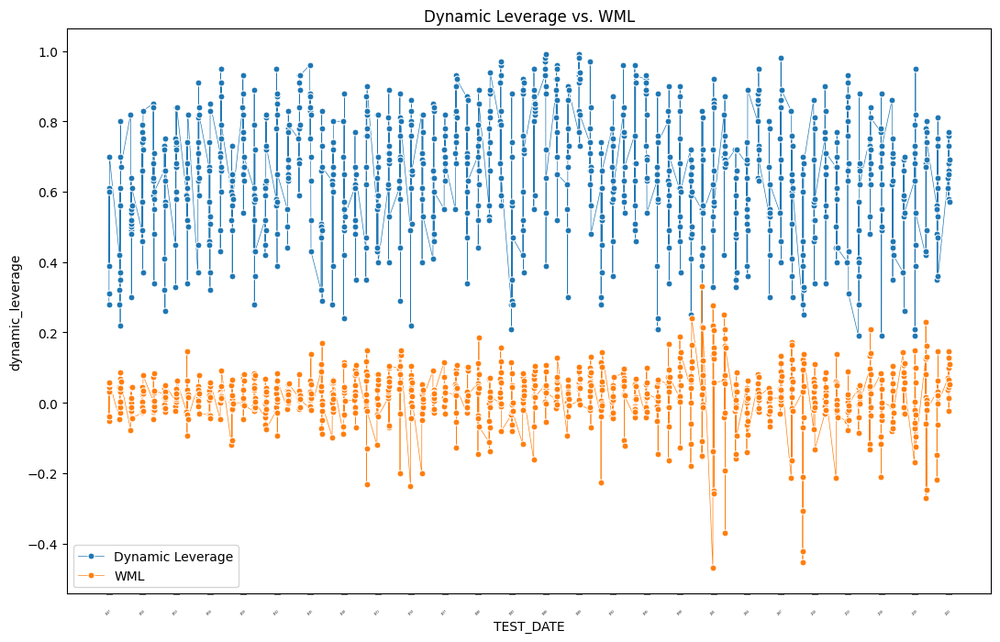

In [27]:
plot_dynamic_momentum(Fixed_RDF_Result)

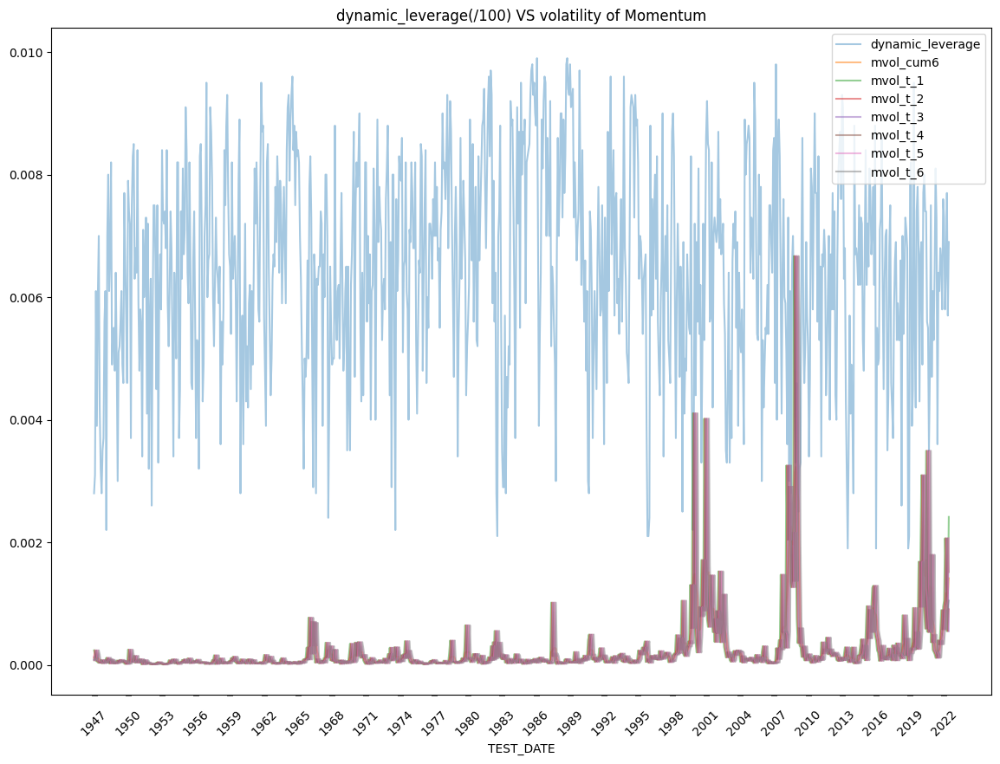

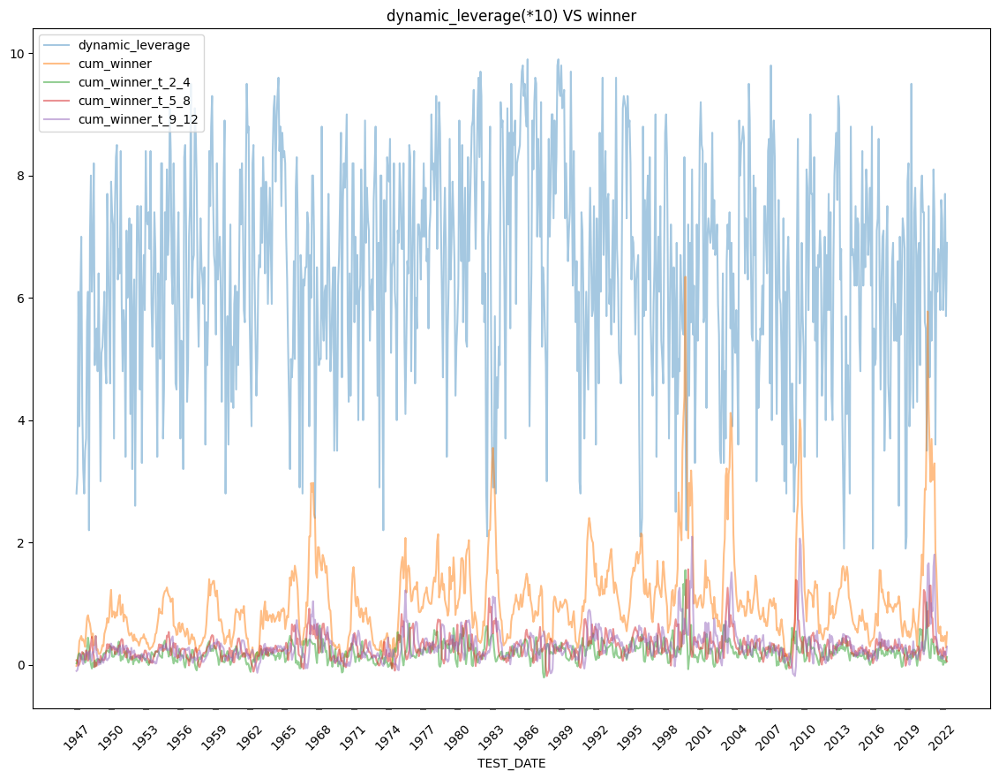

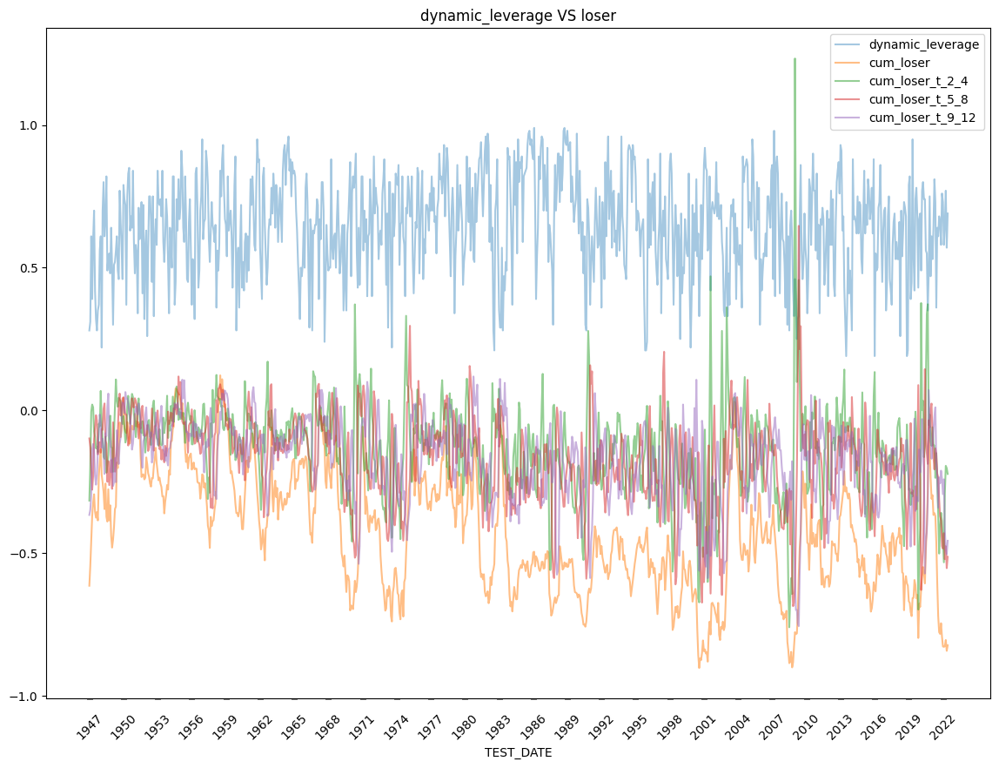

In [58]:
save_RDF = leverage_save(Fixed_RDF_Result, DATA)
save_RDF.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/RDF_{case_name}.csv')



Feature Importance of the model



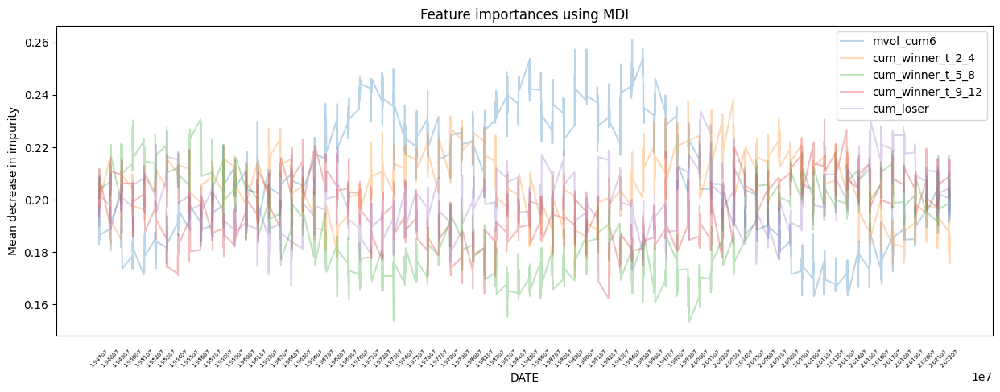

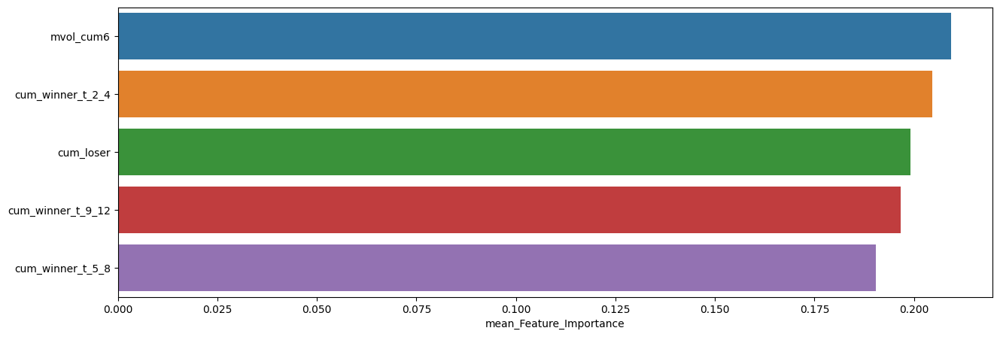

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.209259,0.260890,0.163114
cum_winner_t_2_4,0.204601,0.237992,0.170506
cum_loser,0.199029,0.233786,0.167161
cum_winner_t_9_12,0.196633,0.230606,0.162372
cum_winner_t_5_8,0.190477,0.230668,0.153443


In [29]:
plot_feature_importances(Fixed_RDF_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.29      0.20      0.24        75
         1.0       0.66      0.76      0.71       151

    accuracy                           0.58       226
   macro avg       0.48      0.48      0.47       226
weighted avg       0.54      0.58      0.55       226


accuracy : 0.5752212389380531

precision : 0.6571428571428571

recall : 0.7615894039735099

F1-Score : 0.7055214723926381



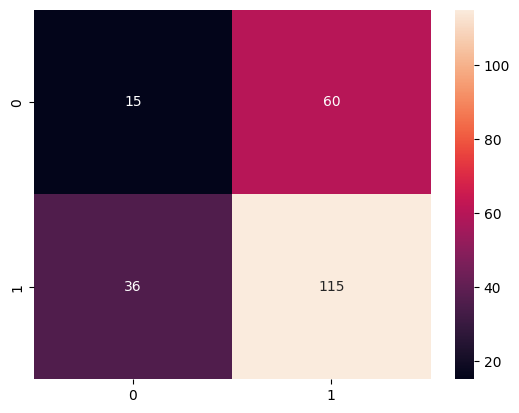


Feature Importance of the model



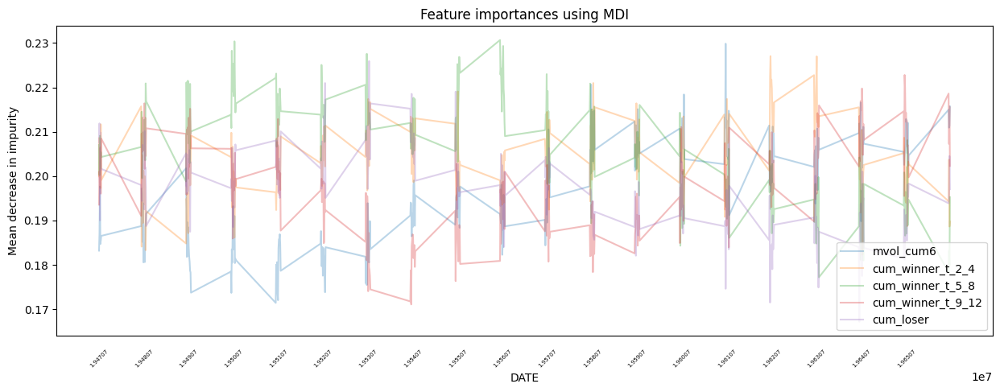

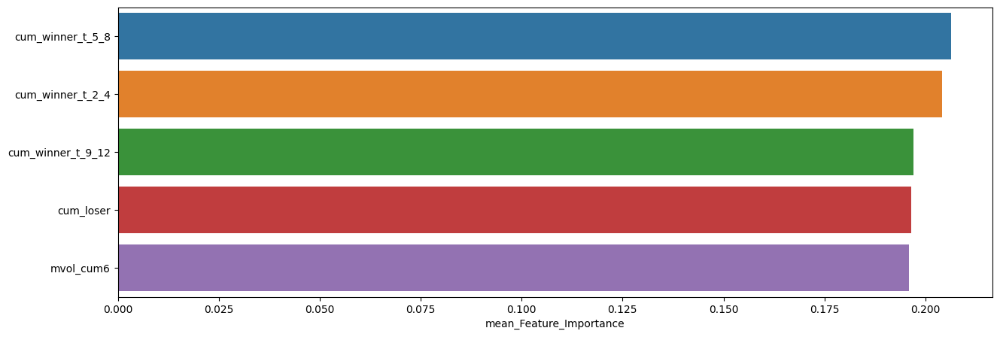

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.206322,0.230668,0.177181
cum_winner_t_2_4,0.204085,0.227033,0.182261
cum_winner_t_9_12,0.196992,0.222795,0.171069
cum_loser,0.196586,0.225928,0.167161
mvol_cum6,0.196015,0.229850,0.171417



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.34      0.19      0.24        75
         1.0       0.67      0.82      0.74       151

    accuracy                           0.61       226
   macro avg       0.51      0.50      0.49       226
weighted avg       0.56      0.61      0.57       226


accuracy : 0.6106194690265486

precision : 0.6702702702702703

recall : 0.8211920529801324

F1-Score : 0.738095238095238



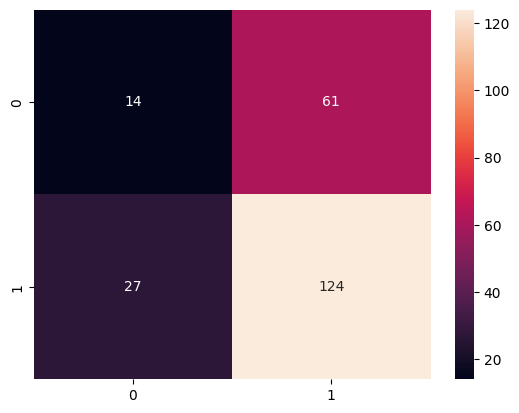


Feature Importance of the model



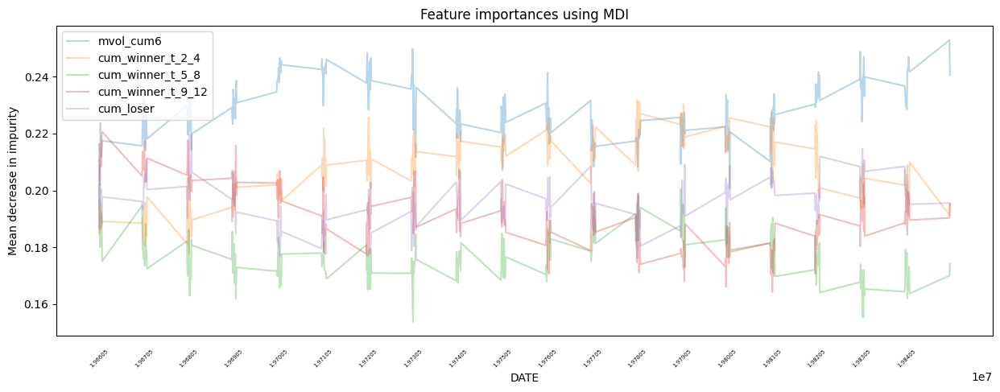

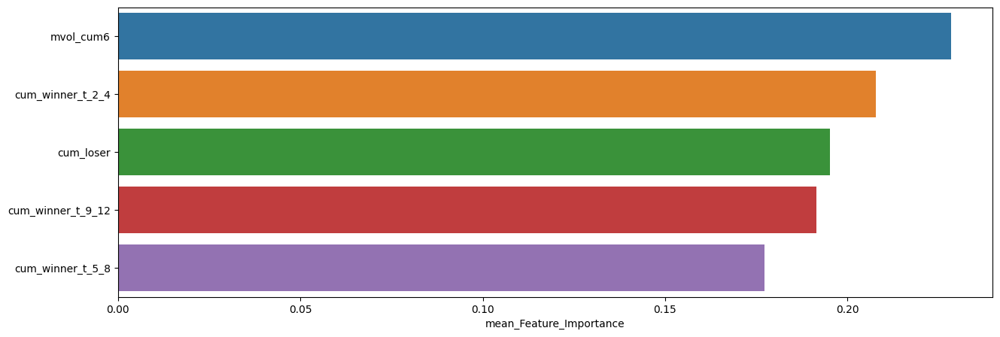

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.228308,0.252833,0.200598
cum_winner_t_2_4,0.207776,0.231859,0.177863
cum_loser,0.195241,0.219906,0.176184
cum_winner_t_9_12,0.191472,0.220600,0.164322
cum_winner_t_5_8,0.177203,0.202397,0.153783



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.19      0.24        70
         1.0       0.69      0.83      0.75       156

    accuracy                           0.63       226
   macro avg       0.51      0.51      0.50       226
weighted avg       0.58      0.63      0.59       226


accuracy : 0.6283185840707964

precision : 0.6935483870967742

recall : 0.8269230769230769

F1-Score : 0.7543859649122807



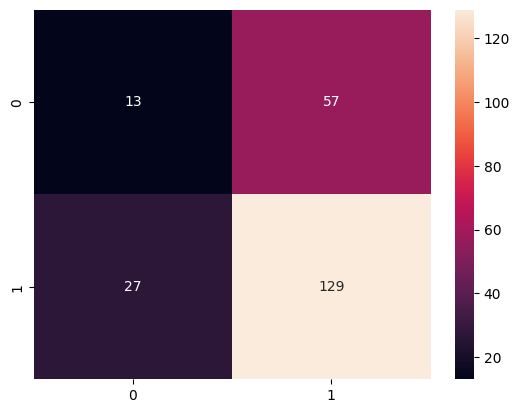


Feature Importance of the model



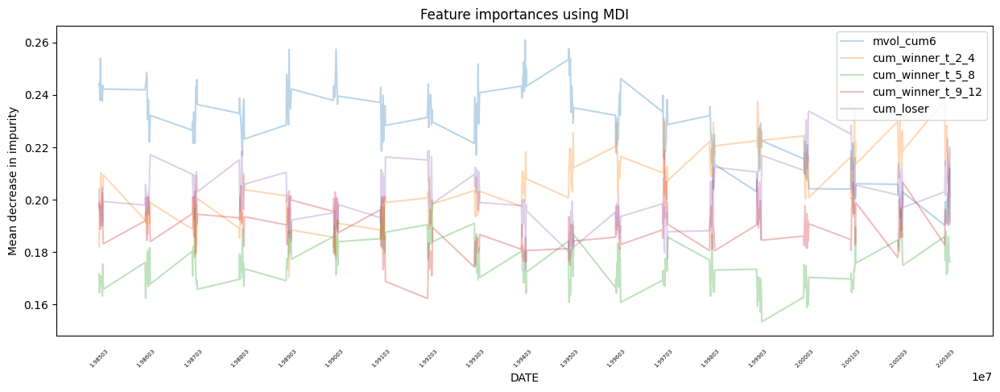

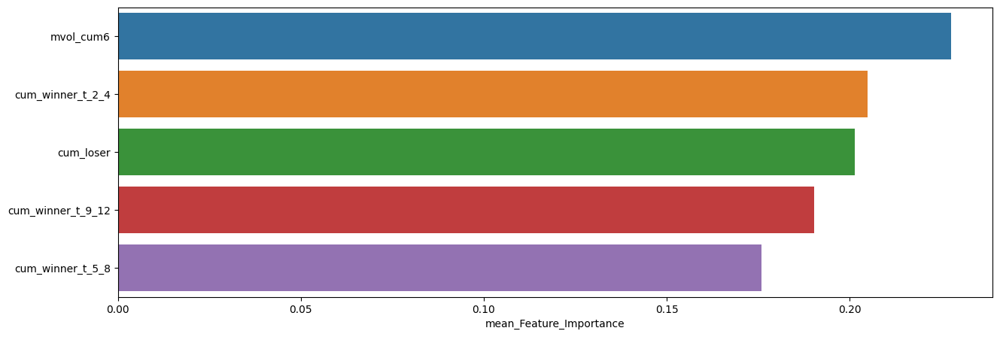

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.227619,0.260890,0.188224
cum_winner_t_2_4,0.204888,0.237992,0.170506
cum_loser,0.201301,0.233786,0.173169
cum_winner_t_9_12,0.190228,0.219788,0.162372
cum_winner_t_5_8,0.175964,0.199970,0.153443



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.48      0.29      0.36        96
         1.0       0.60      0.77      0.68       132

    accuracy                           0.57       228
   macro avg       0.54      0.53      0.52       228
weighted avg       0.55      0.57      0.54       228


accuracy : 0.5701754385964912

precision : 0.6

recall : 0.7727272727272727

F1-Score : 0.6754966887417219



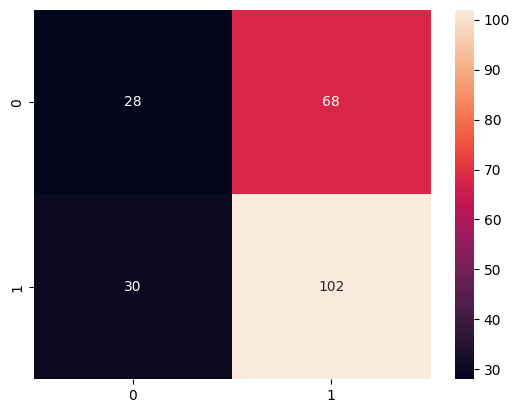


Feature Importance of the model



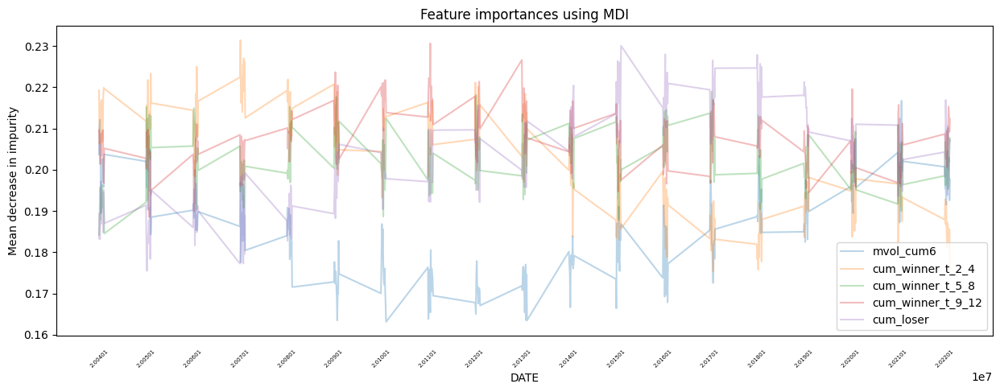

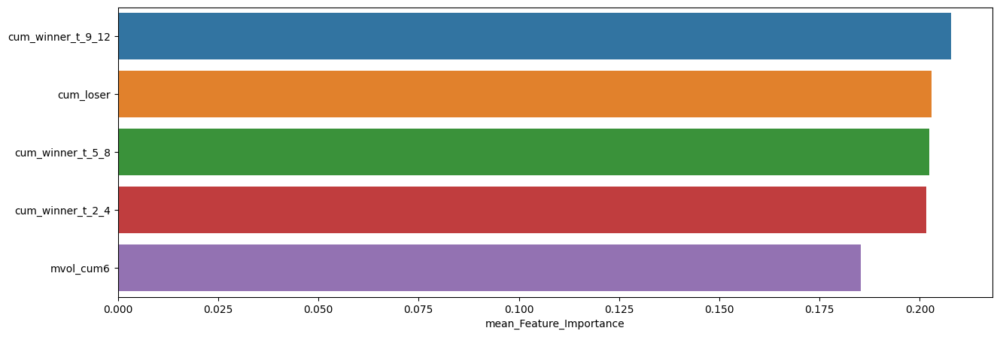

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.207742,0.230606,0.188501
cum_loser,0.202952,0.230035,0.175469
cum_winner_t_5_8,0.202315,0.218864,0.184178
cum_winner_t_2_4,0.201682,0.231399,0.175321
mvol_cum6,0.185308,0.216696,0.163114


In [30]:
slice_feature_importance(Fixed_RDF_Result, 4)

## Grdient Boosting

In [31]:
GBC_Param = {}
GBC = GradientBoostingClassifier(*GBC_Param, random_state=42)

In [32]:
Fixed_GBC_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=GBC) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   ccp_alpha : 0.0
   criterion : friedman_mse
   init : None
   learning_rate : 0.1
   loss : log_loss
   max_depth : 3
   max_features : None
   max_leaf_nodes : None
   min_impurity_decrease : 0.0
   min_samples_leaf : 1
   min_samples_split : 2
   min_weight_fraction_leaf : 0.0
   n_estimators : 100
   n_iter_no_change : None
   random_state : 42
   subsample : 1.0
   tol : 0.0001
   validation_fraction : 0.1
   verbose : 0
   warm_start : False

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.7415169067587142


최근 누적 수익률

  2022년-12월 -> 8147.68
  2022년-11월 -> 7391.01
  2022년-10월 -> 7109.64
  2022년-09월 -> 6587.43
  2022년-08월 -> 6441.10

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 9425.87
  2등 : 2008년-06월 -> 9261.75
  3등 : 2008년-11월 -> 8769.21
  4등 : 2009년-01월 -> 8619.95
  5등 : 2008년-12월 -> 8609.94
  6등 : 2008년-10월 -> 8552.19
  7등 : 2002년-09월 -> 8305.51
  8등 : 2008년-05월 -> 8280.83
  9등 : 2007년-12월 -> 8173.82
  10등 : 2022년-12월 -> 8147.68



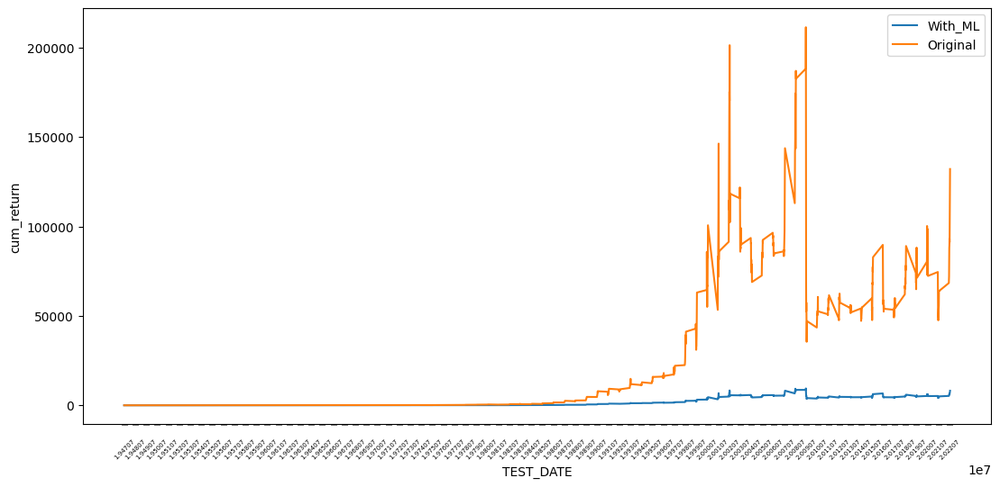

In [33]:
cum_return_sharpe_ratio(data=Fixed_GBC_Result, dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.36      0.22      0.28       316
         1.0       0.65      0.78      0.71       590

    accuracy                           0.59       906
   macro avg       0.51      0.50      0.49       906
weighted avg       0.55      0.59      0.56       906


accuracy : 0.5894039735099338

precision : 0.653954802259887

recall : 0.7847457627118644

F1-Score : 0.7134052388289676



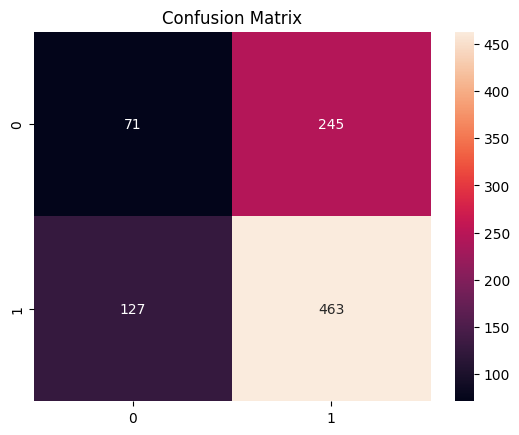


ACTUAL = PRED = 1



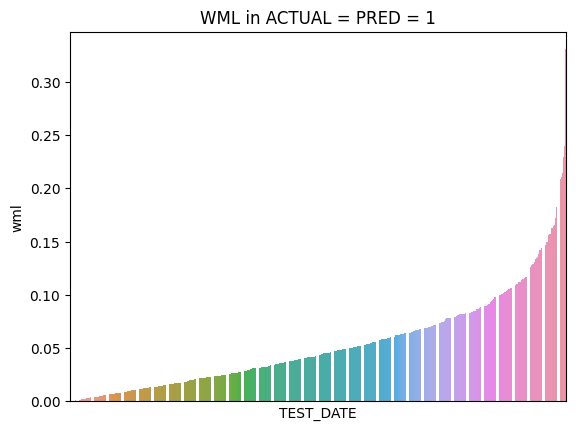

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,463.0,0.053534,0.00202,0.044942,0.000007,0.000923,0.020596,0.043049,0.074257,0.209486,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,463.0,0.041633,0.001307,0.036158,0.000004,0.000627,0.014517,0.032619,0.056747,0.168191,0.268611



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



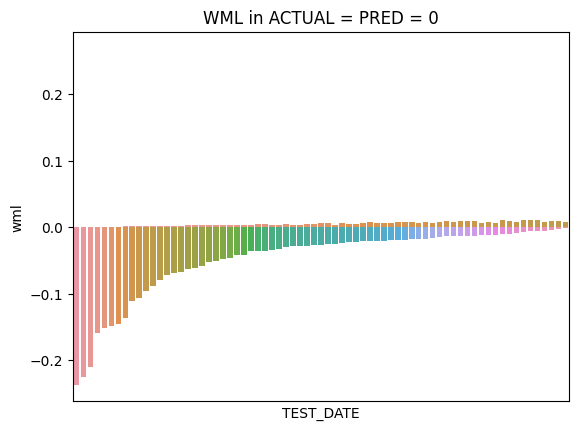

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,71.0,-0.048271,0.002894,0.053796,-0.237095,-0.229106,-0.059847,-0.026922,-0.014189,-0.00257,-0.00129


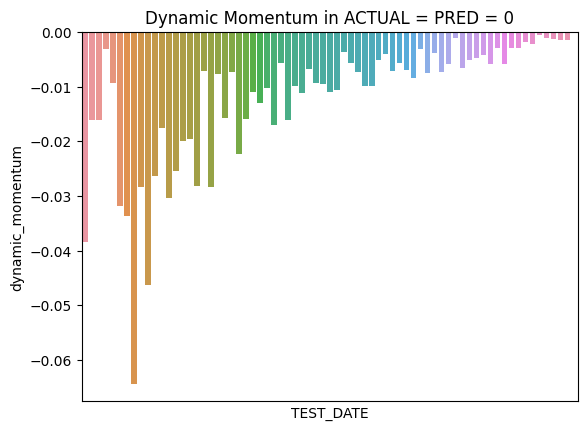

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,71.0,-0.012057,0.000139,0.011789,-0.064372,-0.051709,-0.016078,-0.007617,-0.004563,-0.000464,-0.000205



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



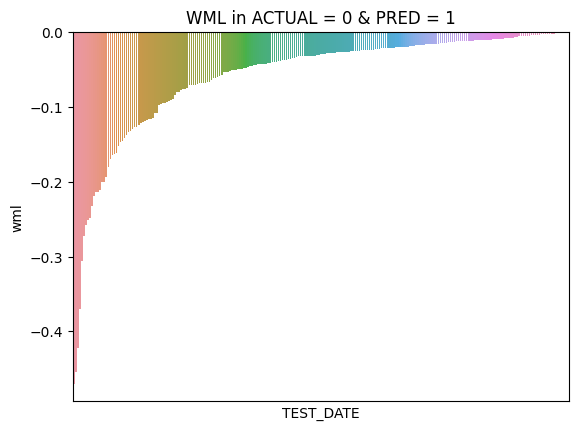

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,245.0,-0.058641,0.005697,0.075475,-0.469903,-0.399362,-0.069463,-0.029816,-0.015103,-0.000705,-0.000132


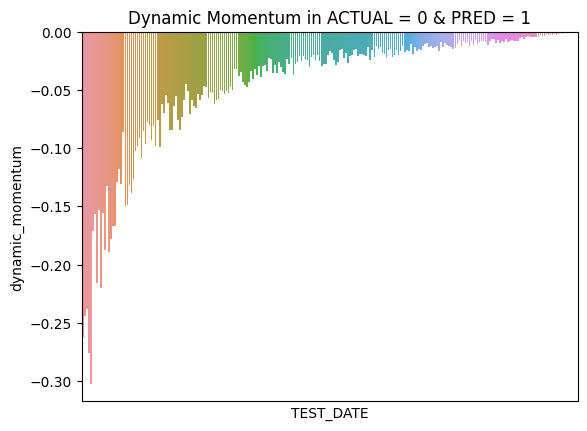

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,245.0,-0.043672,0.002934,0.054167,-0.30237,-0.254561,-0.053074,-0.021857,-0.010928,-0.000574,-0.000116



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



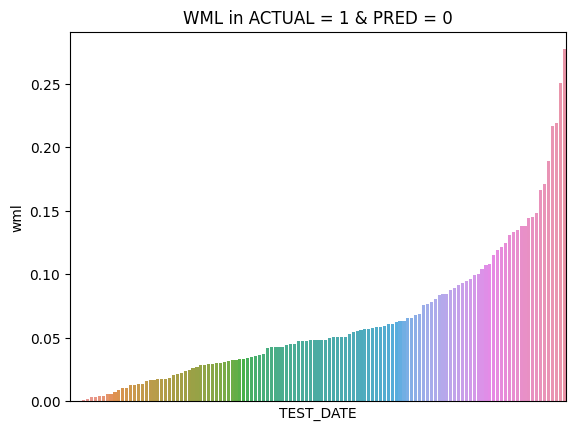

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,127.0,0.061504,0.002787,0.052796,0.000577,0.000644,0.026672,0.048077,0.08423,0.242073,0.276912


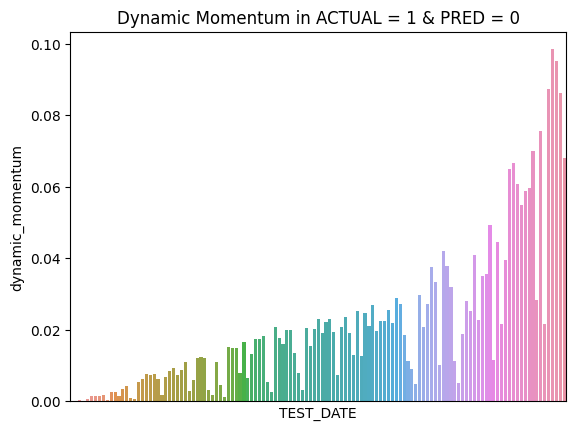

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,127.0,0.021108,0.000445,0.02109,0.000142,0.000165,0.006394,0.016576,0.025498,0.093031,0.098354


In [34]:
plot_predict_result(Fixed_GBC_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.268611,1.0,0.813571,1.0,0.243351,0.269961,0.145427,0.168823,0.172438,4058.006281
20010928,19810930,20010831,0.207369,0.196029,1.0,0.945316,1.0,0.209062,0.254990,0.157252,0.186062,0.192635,6751.226603
20200331,20000331,20200228,0.229130,0.185340,1.0,0.808884,1.0,0.124997,0.160749,0.225245,0.298021,0.190988,6179.391618
20001229,19801231,20001130,0.214018,0.174890,1.0,0.817174,1.0,0.168336,0.234599,0.143521,0.190607,0.262936,4550.105942
19991231,19791231,19991130,0.239571,0.172341,1.0,0.719375,1.0,0.223856,0.319005,0.154065,0.145285,0.157788,3131.184671



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20090831,19890831,20090731,-0.305990,-0.302370,0.0,0.988172,1.0,0.095669,0.238294,0.263641,0.211853,0.190543,3616.675476
20021129,19821130,20021031,-0.370041,-0.275465,0.0,0.744420,1.0,0.182543,0.256683,0.173322,0.200631,0.186821,5012.707884
20010131,19810130,20001229,-0.469903,-0.262557,0.0,0.558747,1.0,0.170134,0.258933,0.151473,0.194117,0.225344,3355.181603
20090430,19890428,20090331,-0.454349,-0.244385,0.0,0.537879,1.0,0.078555,0.233481,0.262563,0.216551,0.208851,5427.582611
20090331,19890331,20090227,-0.422400,-0.237889,0.0,0.563184,1.0,0.100354,0.242803,0.223039,0.232696,0.201108,7183.323353


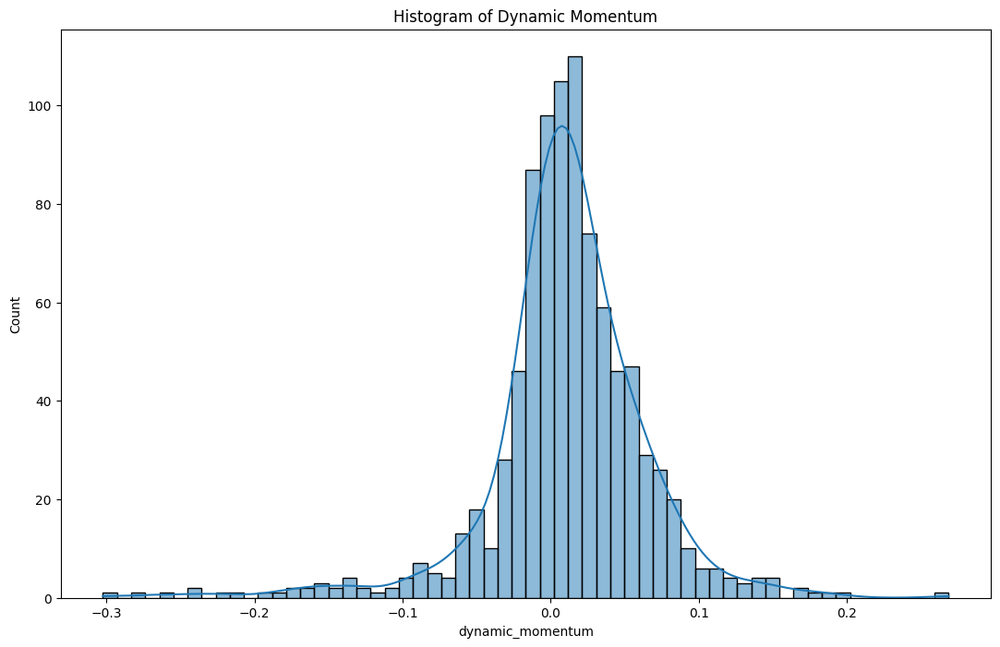

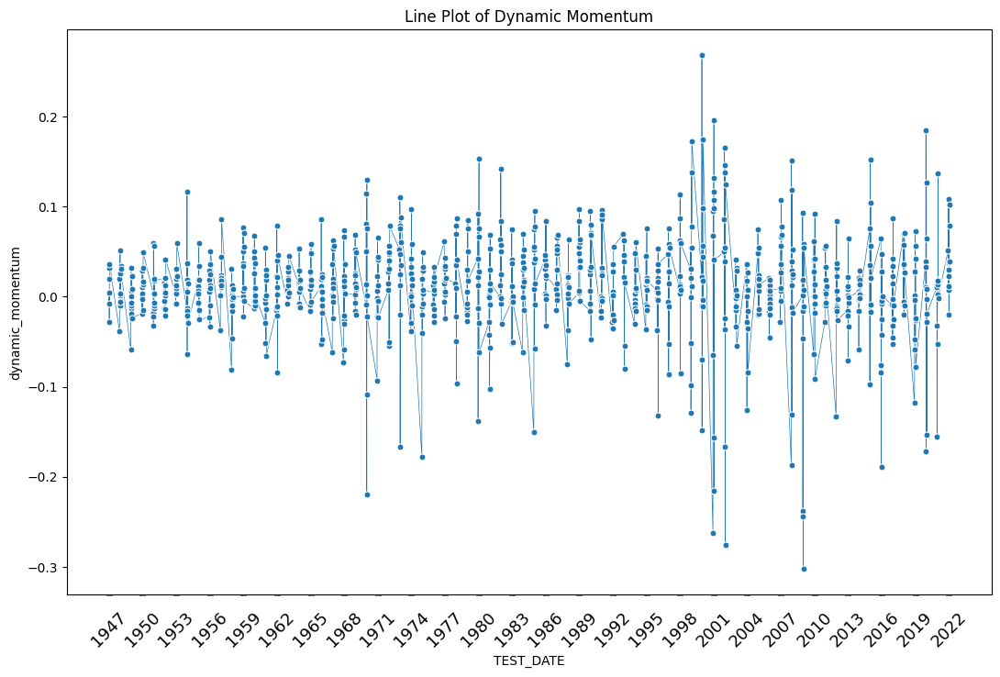

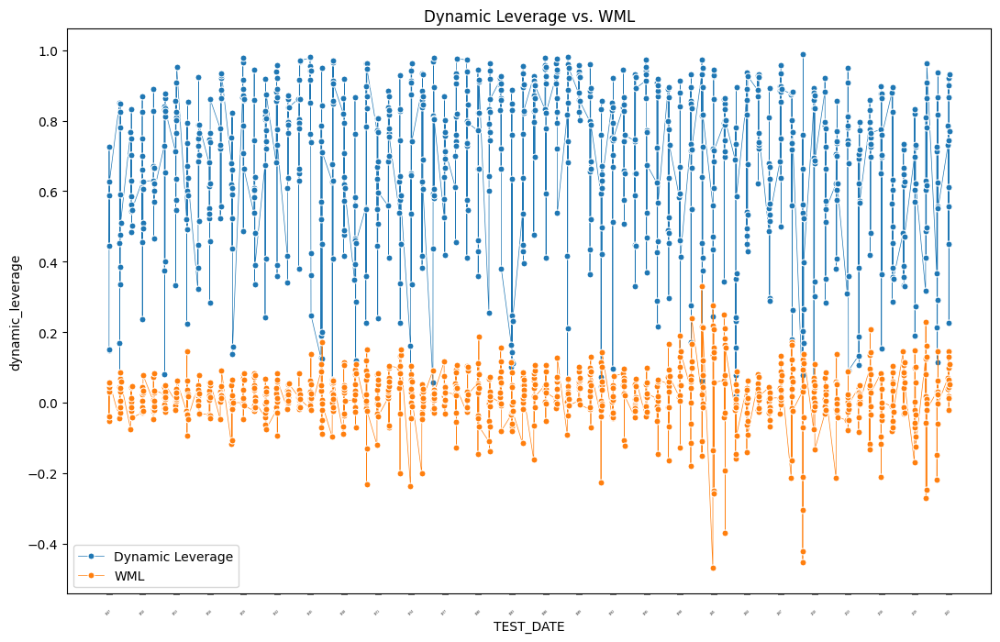

In [35]:
plot_dynamic_momentum(Fixed_GBC_Result)

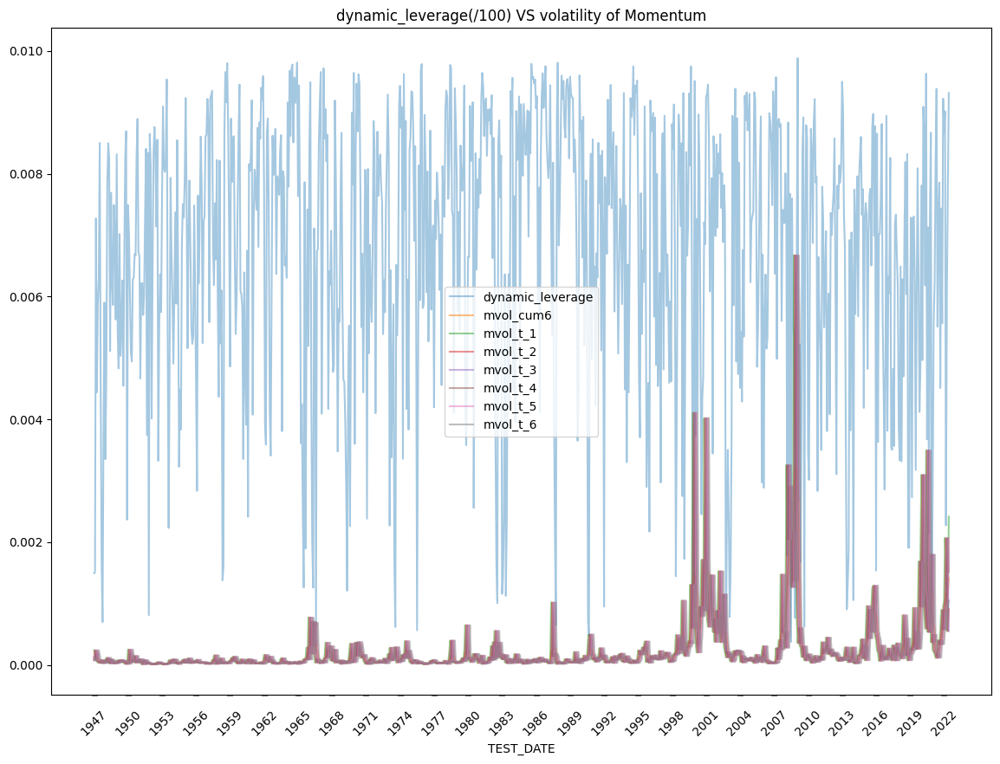

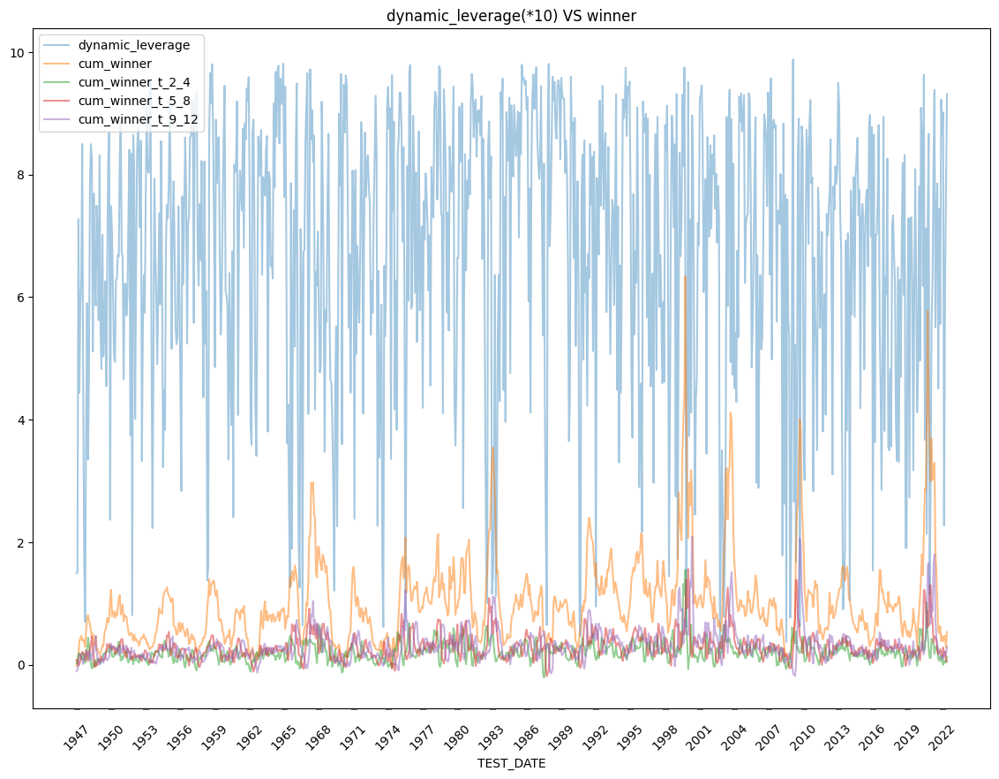

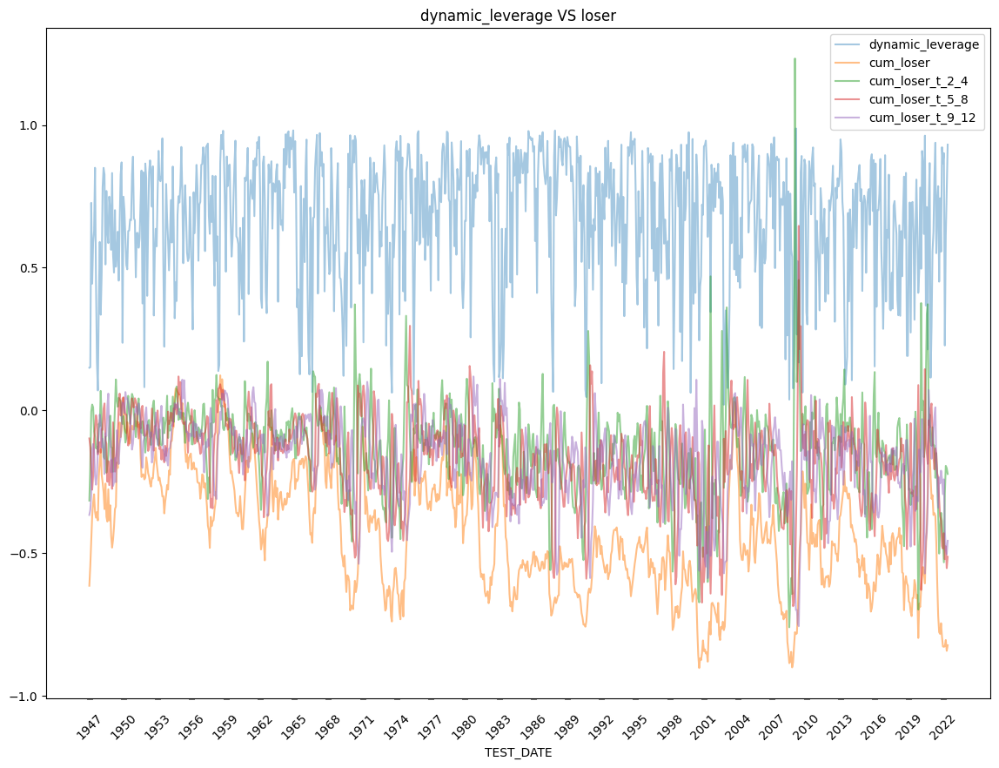

In [57]:
save_GBC = leverage_save(Fixed_GBC_Result, DATA)
save_GBC.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/GBC_{case_name}.csv')



Feature Importance of the model



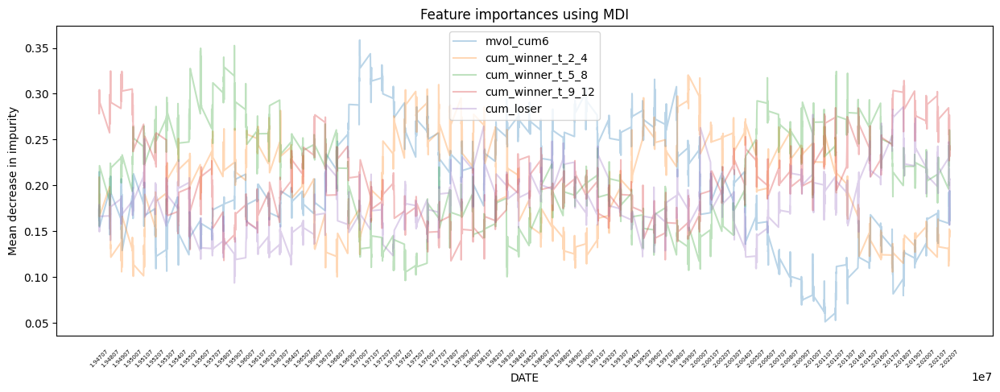

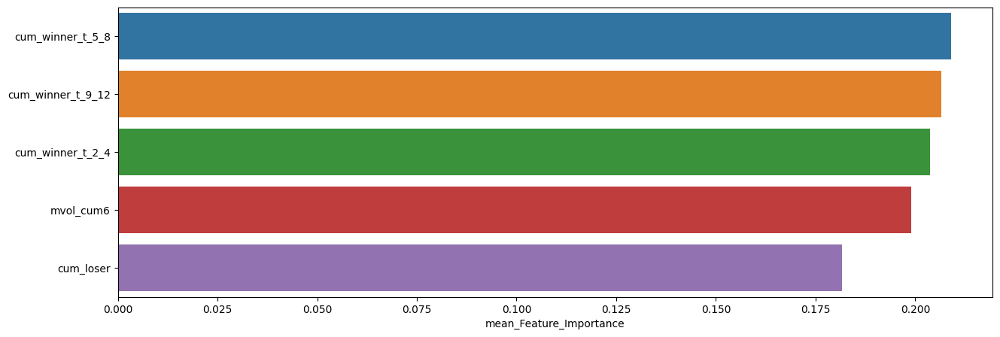

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.208947,0.352543,0.096227
cum_winner_t_9_12,0.206525,0.324798,0.117659
cum_winner_t_2_4,0.203802,0.320407,0.100141
mvol_cum6,0.199060,0.358620,0.051157
cum_loser,0.181666,0.285555,0.093537


In [37]:
plot_feature_importances(Fixed_GBC_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.40      0.24      0.30        75
         1.0       0.69      0.82      0.75       151

    accuracy                           0.63       226
   macro avg       0.54      0.53      0.52       226
weighted avg       0.59      0.63      0.60       226


accuracy : 0.6283185840707964

precision : 0.6850828729281768

recall : 0.8211920529801324

F1-Score : 0.746987951807229



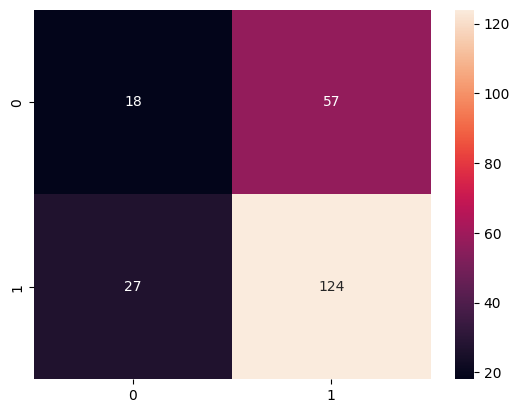


Feature Importance of the model



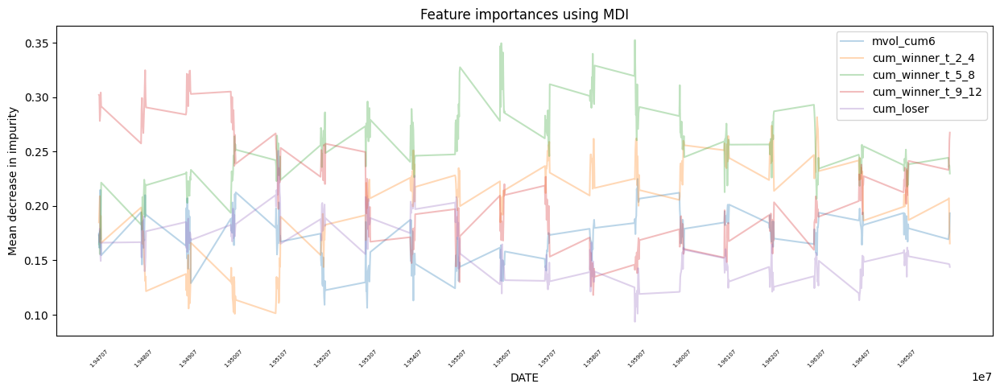

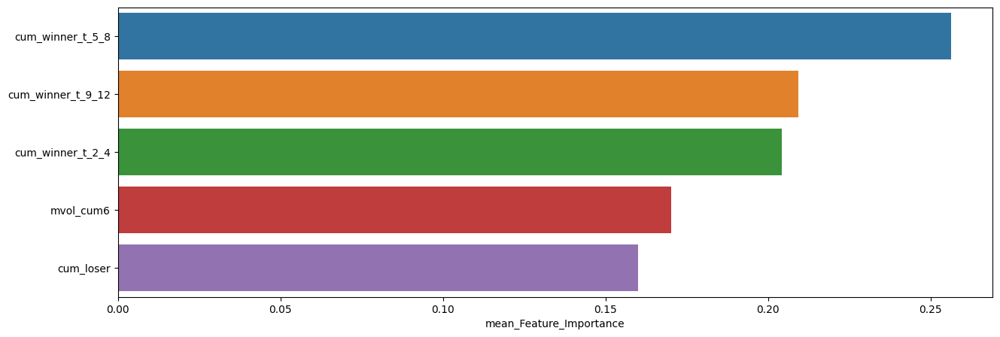

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.256221,0.352543,0.155680
cum_winner_t_9_12,0.209324,0.324798,0.118107
cum_winner_t_2_4,0.204205,0.281671,0.100833
mvol_cum6,0.170178,0.224851,0.106395
cum_loser,0.160072,0.250648,0.093537



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.31      0.20      0.24        75
         1.0       0.66      0.77      0.71       151

    accuracy                           0.58       226
   macro avg       0.48      0.49      0.48       226
weighted avg       0.54      0.58      0.56       226


accuracy : 0.584070796460177

precision : 0.6610169491525424

recall : 0.7748344370860927

F1-Score : 0.7134146341463414



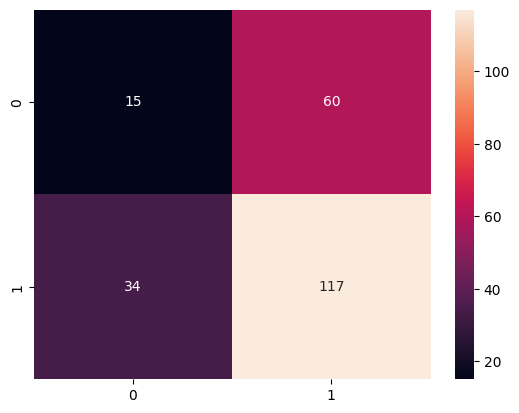


Feature Importance of the model



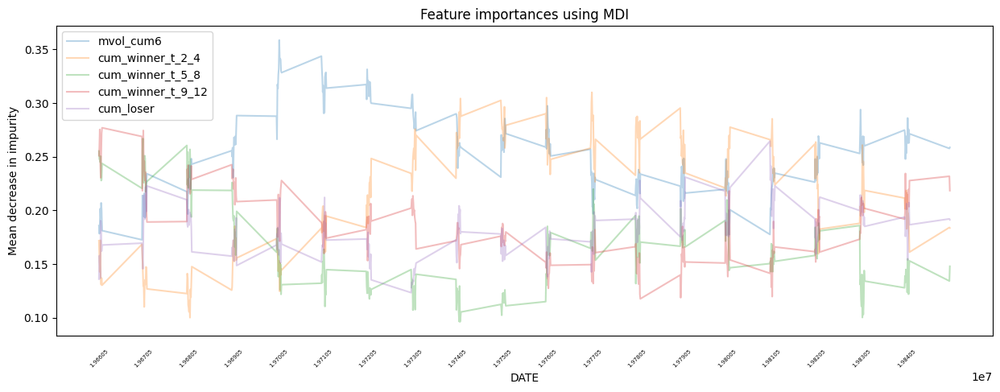

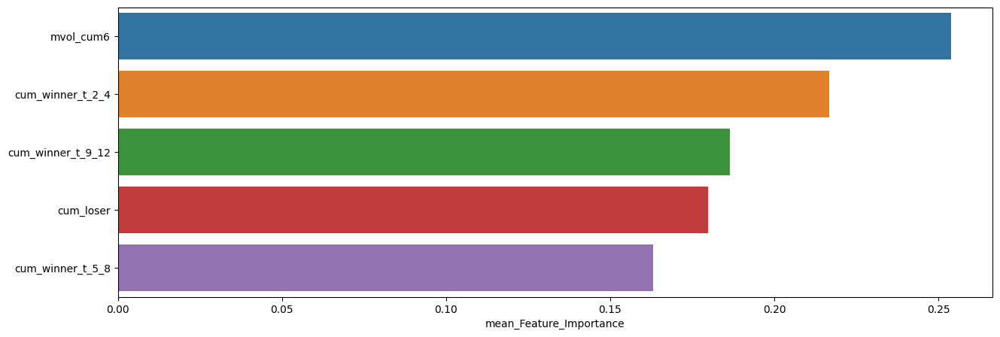

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.253807,0.358620,0.172629
cum_winner_t_2_4,0.216817,0.309951,0.100141
cum_winner_t_9_12,0.186380,0.276982,0.117659
cum_loser,0.179819,0.264527,0.123383
cum_winner_t_5_8,0.163177,0.266902,0.096227



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.29      0.19      0.23        70
         1.0       0.69      0.79      0.74       156

    accuracy                           0.61       226
   macro avg       0.49      0.49      0.48       226
weighted avg       0.56      0.61      0.58       226


accuracy : 0.6061946902654868

precision : 0.6850828729281768

recall : 0.7948717948717948

F1-Score : 0.7359050445103857



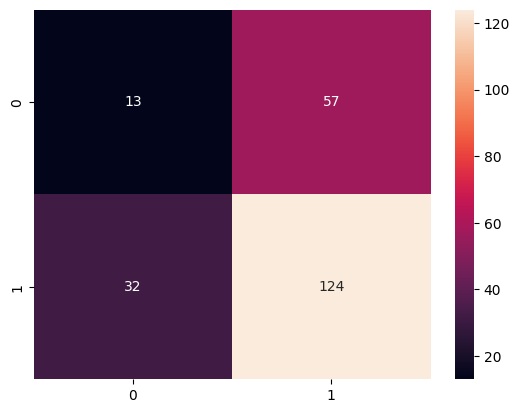


Feature Importance of the model



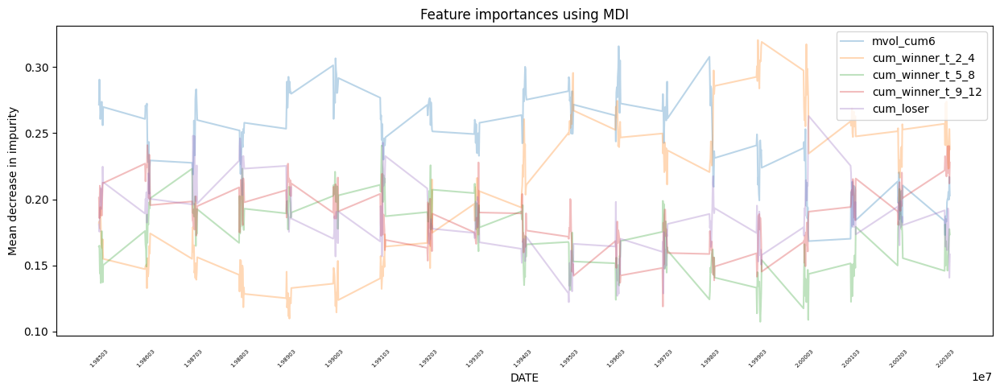

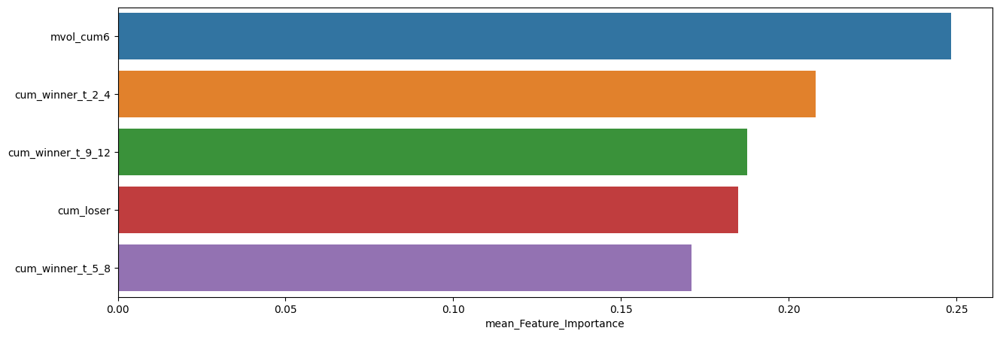

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.248379,0.315738,0.168336
cum_winner_t_2_4,0.208074,0.320407,0.109758
cum_winner_t_9_12,0.187536,0.240885,0.118881
cum_loser,0.185036,0.262936,0.122189
cum_winner_t_5_8,0.170975,0.240545,0.107338



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.42      0.26      0.32        96
         1.0       0.58      0.74      0.65       132

    accuracy                           0.54       228
   macro avg       0.50      0.50      0.49       228
weighted avg       0.51      0.54      0.51       228


accuracy : 0.5394736842105263

precision : 0.5798816568047337

recall : 0.7424242424242424

F1-Score : 0.6511627906976744



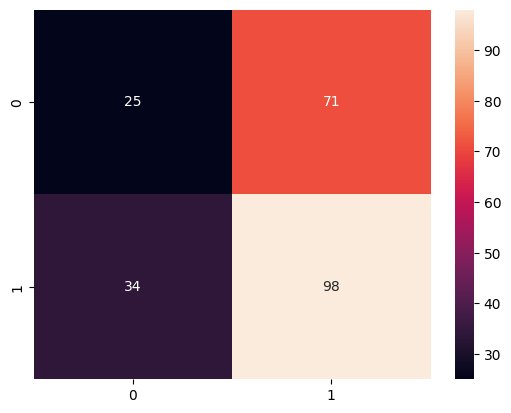


Feature Importance of the model



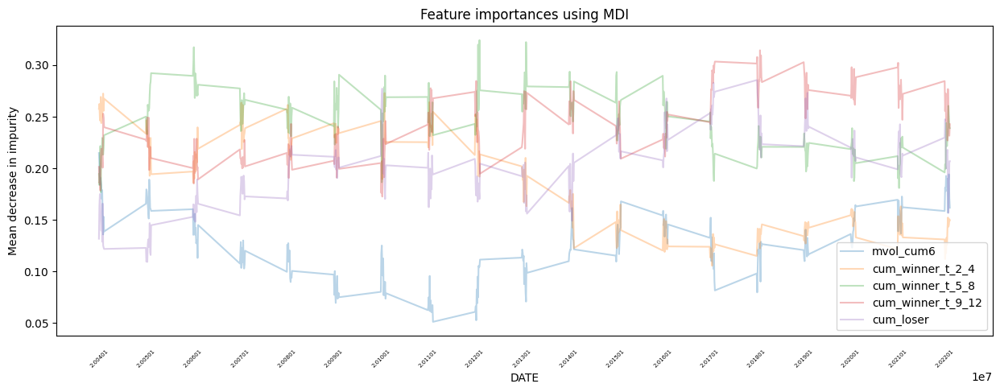

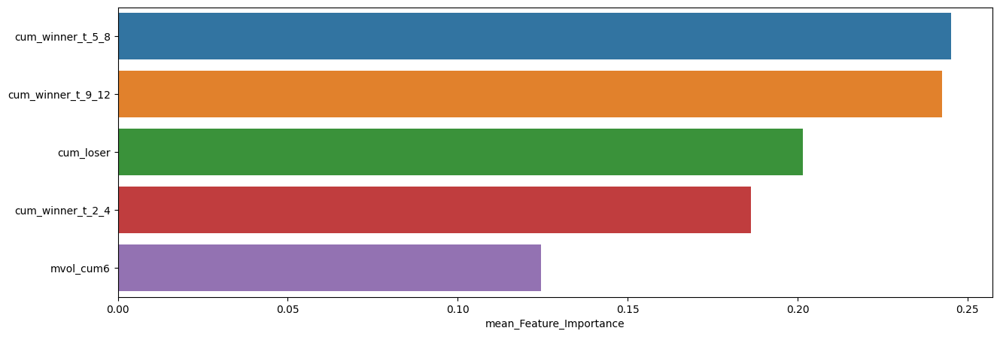

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.245094,0.324315,0.176801
cum_winner_t_9_12,0.242540,0.314440,0.172599
cum_loser,0.201562,0.285555,0.109262
cum_winner_t_2_4,0.186267,0.272957,0.105551
mvol_cum6,0.124537,0.214824,0.051157


In [38]:
slice_feature_importance(Fixed_GBC_Result, 4)

## XGB

In [39]:
XGB_Param = {}
XGB = XGBClassifier(**XGB_Param, random_state=42)

In [40]:
Fixed_XGB_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                  window_size=240, # window size (훈련 데이터 셋 크기)
                                  method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                  model=XGB) 

**************************************************
설정된 Model의 하이퍼파리미터 : 

   objective : binary:logistic
   use_label_encoder : None
   base_score : None
   booster : None
   callbacks : None
   colsample_bylevel : None
   colsample_bynode : None
   colsample_bytree : None
   early_stopping_rounds : None
   enable_categorical : False
   eval_metric : None
   feature_types : None
   gamma : None
   gpu_id : None
   grow_policy : None
   importance_type : None
   interaction_constraints : None
   learning_rate : None
   max_bin : None
   max_cat_threshold : None
   max_cat_to_onehot : None
   max_delta_step : None
   max_depth : None
   max_leaves : None
   min_child_weight : None
   missing : nan
   monotone_constraints : None
   n_estimators : 100
   n_jobs : None
   num_parallel_tree : None
   predictor : None
   random_state : 42
   reg_alpha : None
   reg_lambda : None
   sampling_method : None
   scale_pos_weight : None
   subsample : None
   tree_method : None
   validate_paramete

  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.6970737710301633


최근 누적 수익률

  2022년-12월 -> 8577.60
  2022년-11월 -> 7732.42
  2022년-10월 -> 7550.79
  2022년-09월 -> 6908.86
  2022년-08월 -> 6441.28

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2022년-12월 -> 8577.60
  2등 : 2009년-02월 -> 8437.88
  3등 : 2008년-11월 -> 7868.17
  4등 : 2008년-10월 -> 7814.04
  5등 : 2009년-01월 -> 7806.98
  6등 : 2008년-12월 -> 7781.86
  7등 : 2022년-11월 -> 7732.42
  8등 : 2022년-10월 -> 7550.79
  9등 : 2008년-06월 -> 7480.70
  10등 : 2008년-07월 -> 7454.72



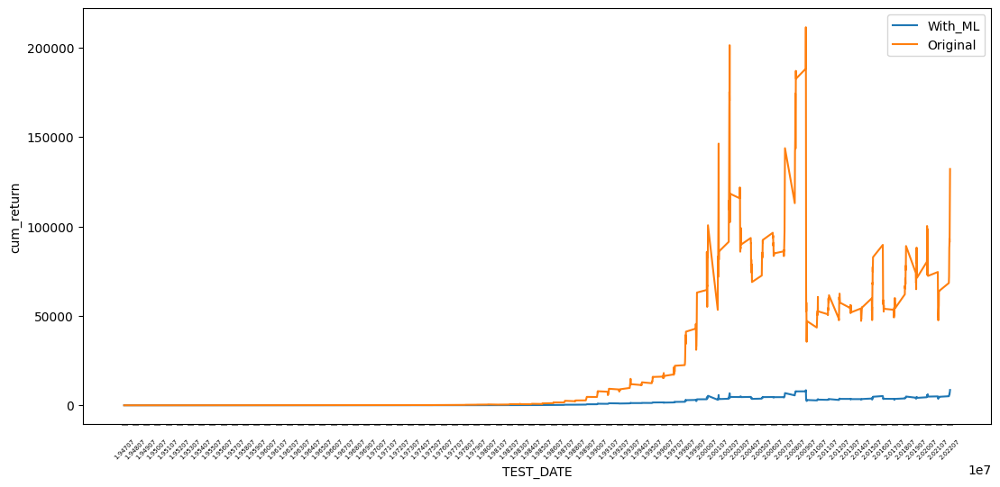

In [41]:
cum_return_sharpe_ratio(data=Fixed_XGB_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.29      0.34       316
         1.0       0.67      0.76      0.71       590

    accuracy                           0.59       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.59      0.58       906


accuracy : 0.5949227373068433

precision : 0.6666666666666666

recall : 0.7559322033898305

F1-Score : 0.7084988085782367



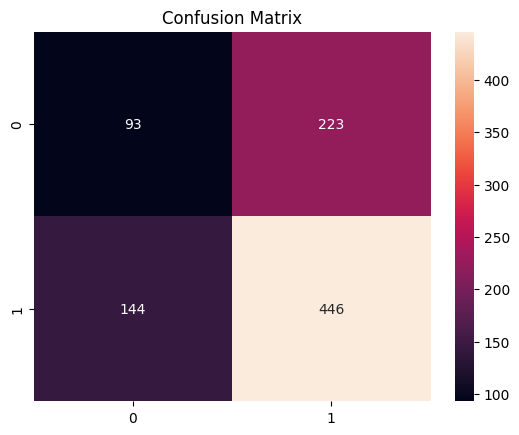


ACTUAL = PRED = 1



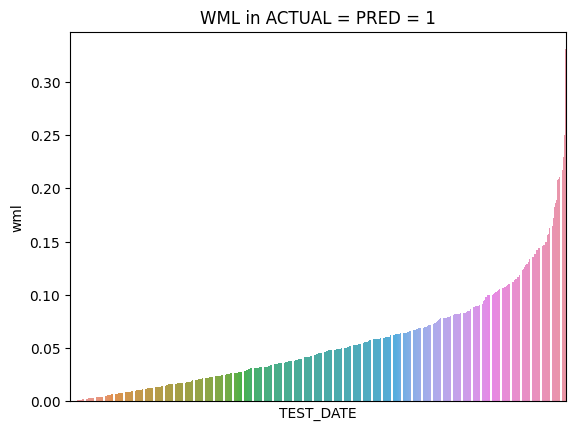

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,446.0,0.055028,0.002208,0.046993,0.000128,0.000743,0.020103,0.044804,0.07798,0.212309,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,446.0,0.047047,0.001648,0.040595,0.000127,0.000649,0.016067,0.037532,0.069031,0.17459,0.327333



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



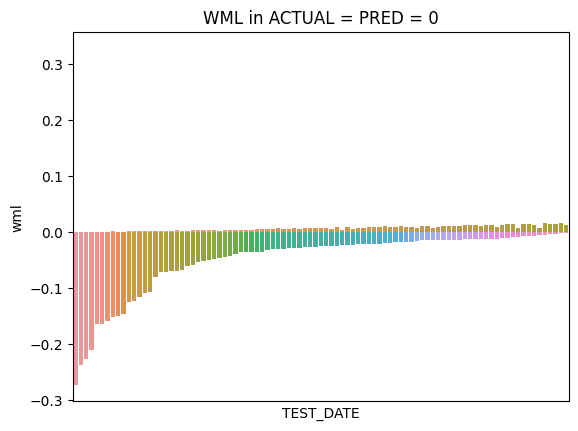

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,93.0,-0.048545,0.003268,0.057168,-0.271971,-0.239885,-0.053421,-0.025151,-0.01358,-0.001983,-0.00129


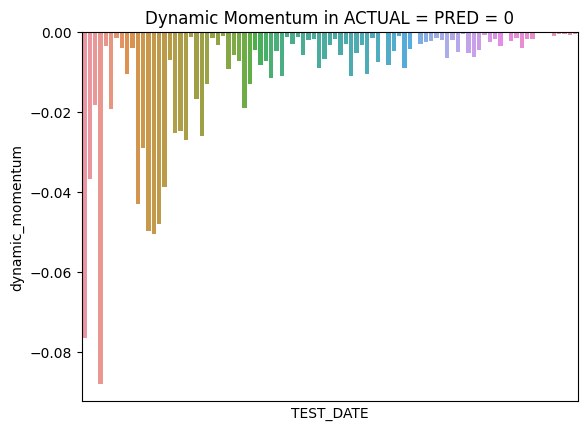

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,93.0,-0.010204,0.00025,0.015807,-0.087926,-0.0775,-0.010483,-0.004265,-0.001768,-0.000099,-0.000079



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



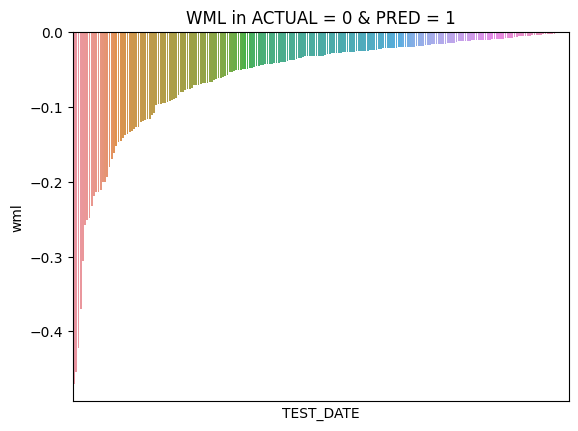

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,223.0,-0.05955,0.00581,0.076224,-0.469903,-0.410881,-0.070858,-0.031619,-0.015839,-0.000606,-0.000132


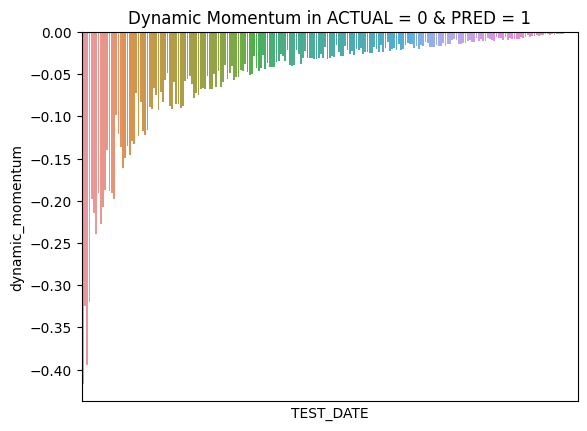

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,223.0,-0.049793,0.004182,0.064666,-0.416741,-0.323462,-0.058611,-0.026576,-0.01272,-0.000573,-0.000129



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



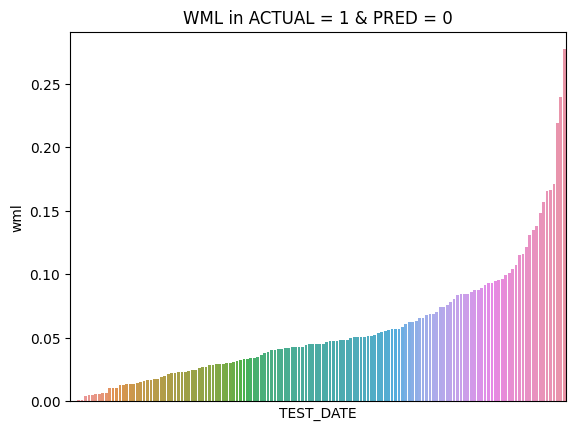

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,144.0,0.055936,0.002153,0.0464,0.000007,0.000859,0.024849,0.04512,0.074209,0.23073,0.276912


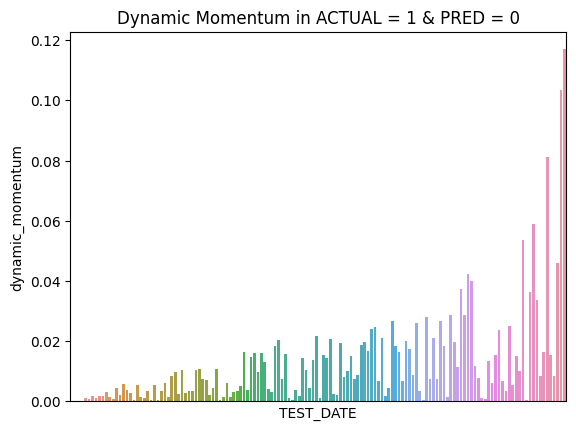

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,144.0,0.012937,0.000293,0.017118,0.000002,0.00003,0.00278,0.007603,0.016624,0.09371,0.116883


In [42]:
plot_predict_result(Fixed_XGB_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.327333,1.0,0.991429,1,0.244382,0.189912,0.149047,0.192389,0.224270,4498.554118
20200331,20000331,20200228,0.229130,0.218408,1.0,0.953204,1,0.219101,0.188757,0.187702,0.217957,0.186483,5581.048434
20010928,19810930,20010831,0.207369,0.204914,1.0,0.988160,1,0.215333,0.234126,0.179249,0.206480,0.164812,5716.599198
20150731,19950731,20150630,0.209036,0.183183,1.0,0.876322,1,0.179407,0.184720,0.203841,0.234134,0.197898,4080.736576
20020228,19820226,20020131,0.250175,0.179507,1.0,0.717523,1,0.213582,0.210043,0.209721,0.173622,0.193032,4346.516937



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20010131,19810130,20001229,-0.469903,-0.416741,0.0,0.886866,1,0.210004,0.175302,0.171355,0.213213,0.230125,3096.710179
20090331,19890331,20090227,-0.422400,-0.394229,0.0,0.933307,1,0.184966,0.192559,0.220814,0.217312,0.184349,5111.027753
20090430,19890428,20090331,-0.454349,-0.324649,0.0,0.714536,1,0.166446,0.196547,0.231470,0.238449,0.167088,3451.414391
20021129,19821130,20021031,-0.370041,-0.319252,0.0,0.862749,1,0.198583,0.212660,0.183289,0.212362,0.193106,4125.545114
20011031,19811030,20010928,-0.250756,-0.238901,0.0,0.952723,1,0.223542,0.222407,0.186168,0.192609,0.175274,4350.657004


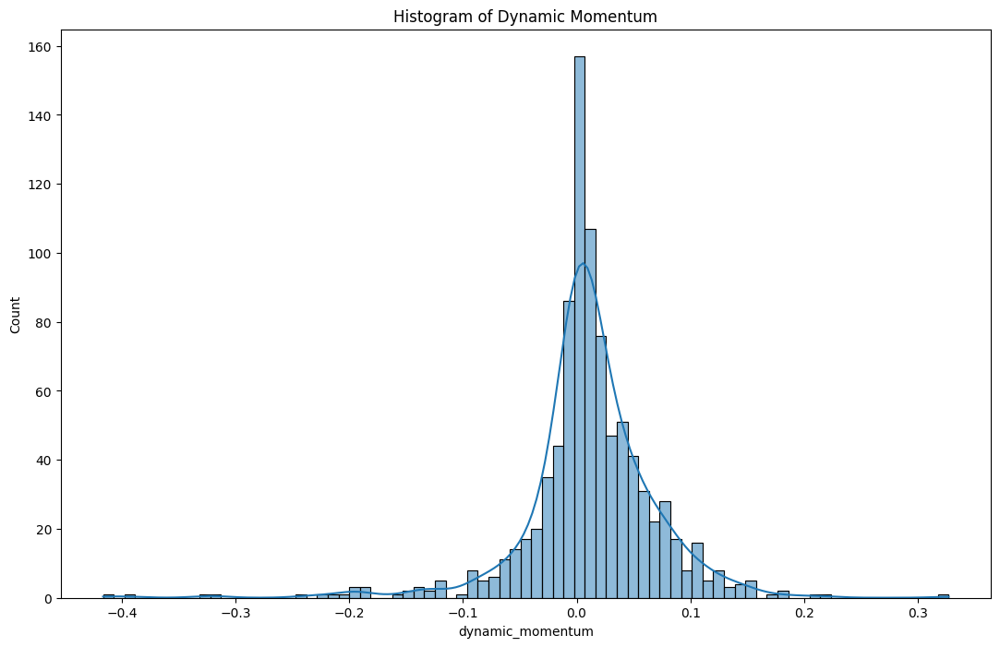

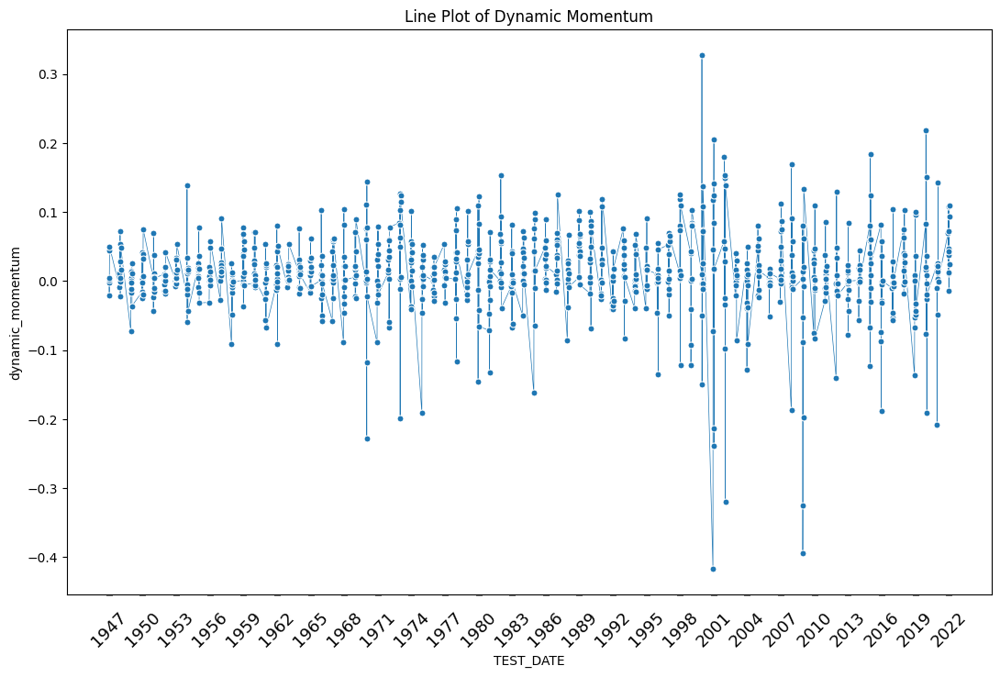

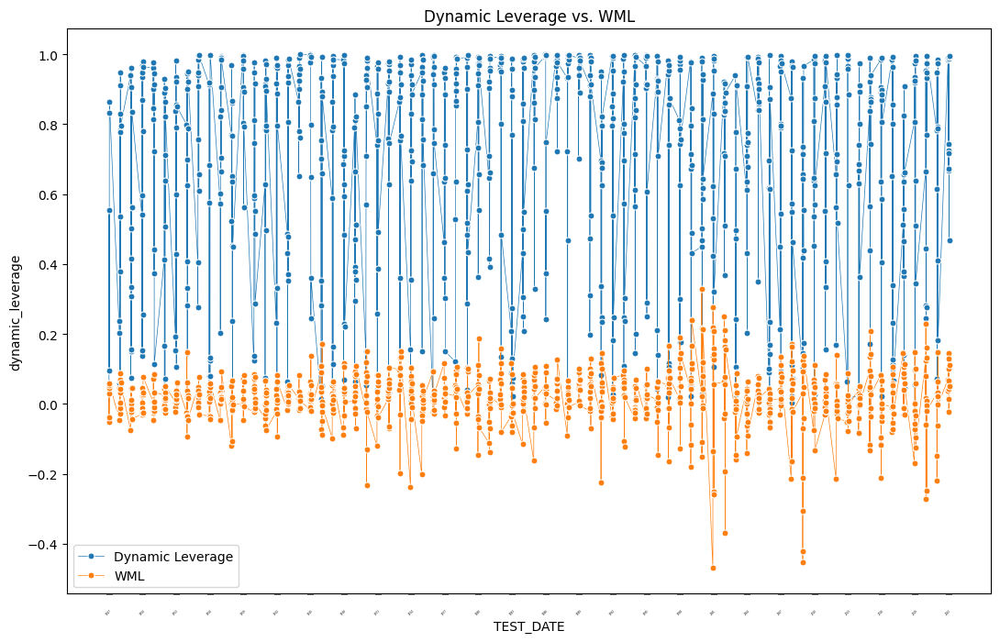

In [43]:
plot_dynamic_momentum(Fixed_XGB_Result)

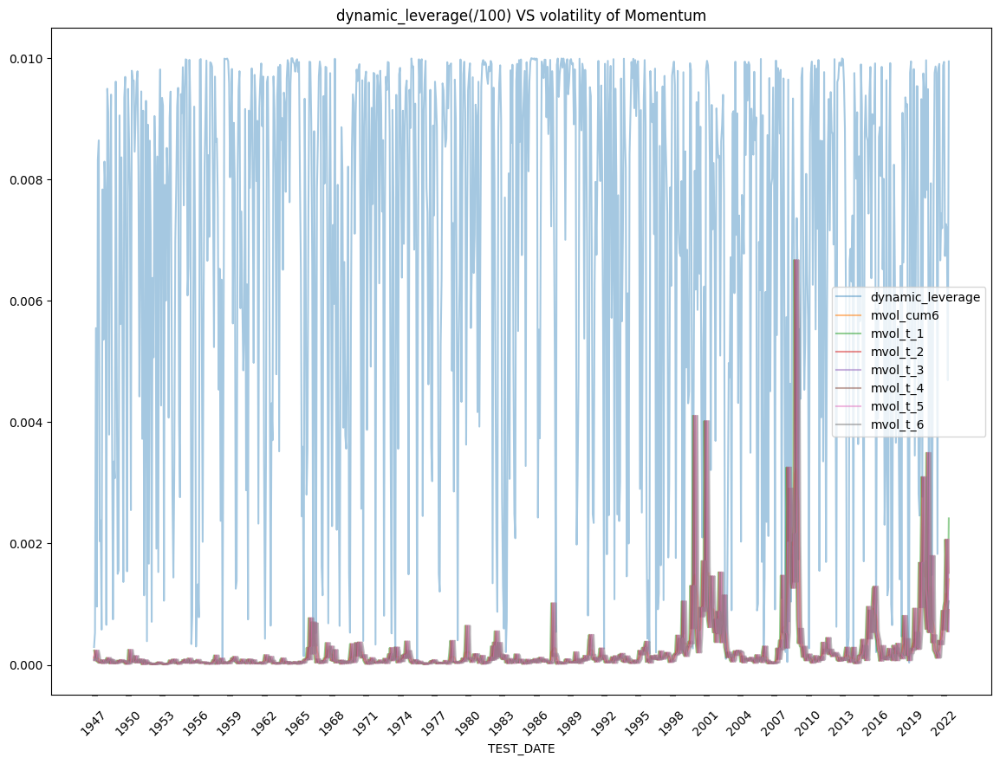

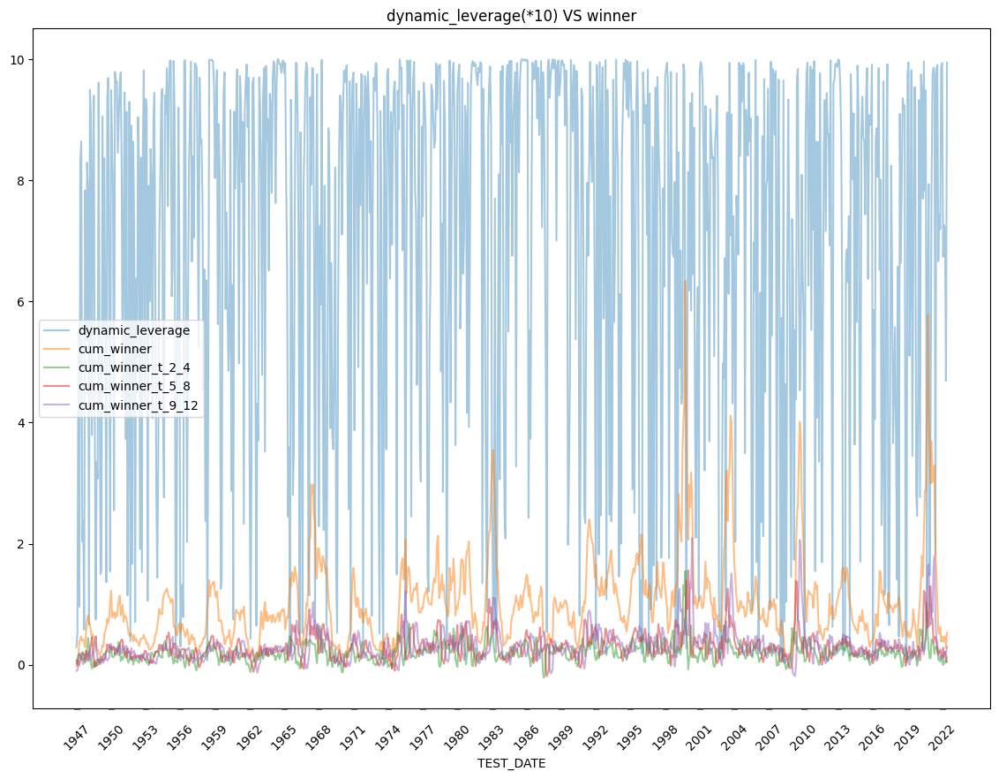

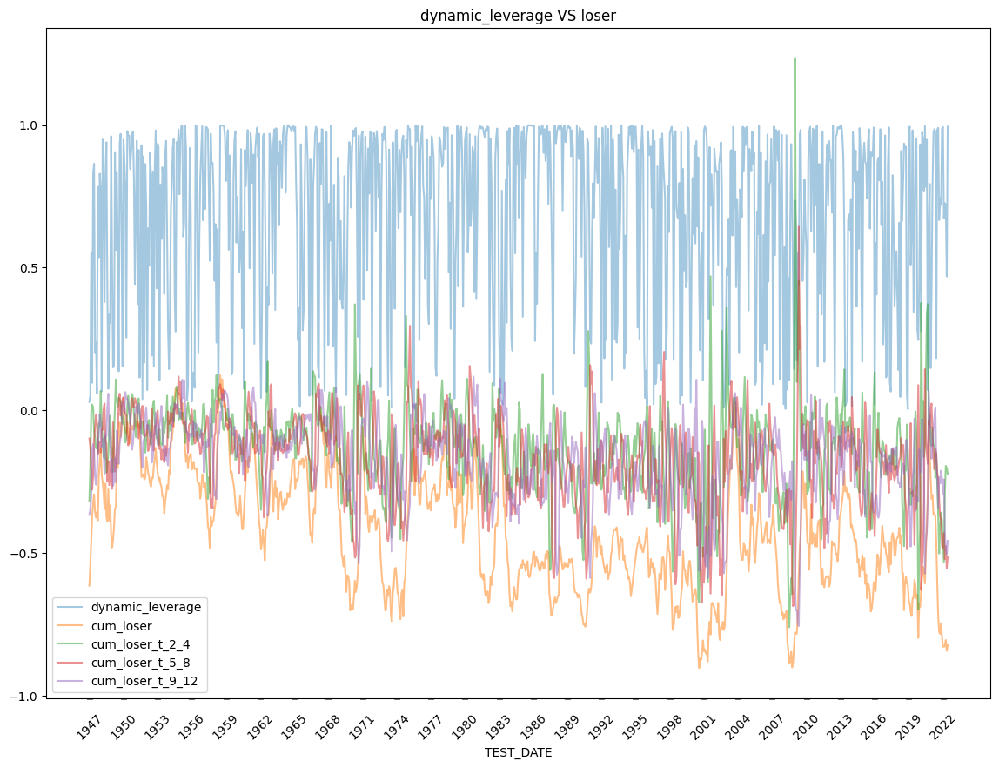

In [56]:
save_XGB = leverage_save(Fixed_XGB_Result, DATA)
save_XGB.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/XGB_{case_name}.csv')



Feature Importance of the model



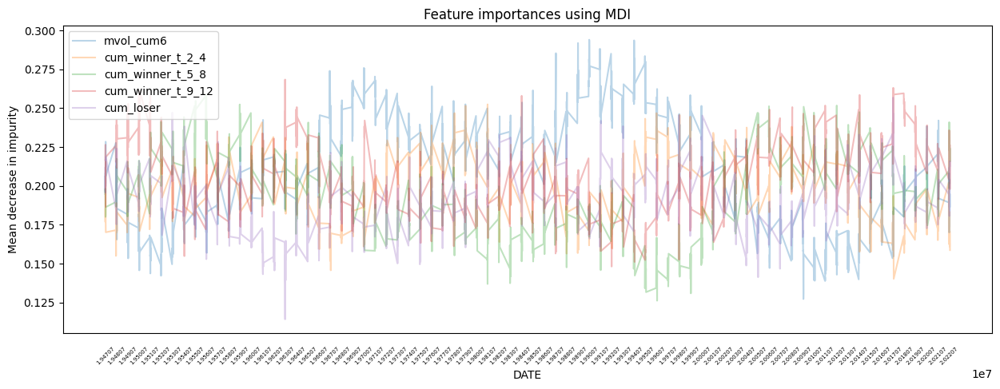

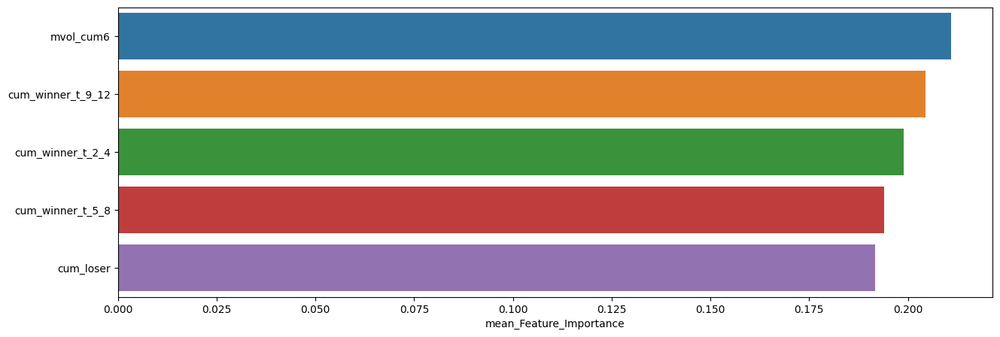

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.210895,0.293965,0.127251
cum_winner_t_9_12,0.204401,0.268369,0.148135
cum_winner_t_2_4,0.198933,0.252403,0.140242
cum_winner_t_5_8,0.193985,0.258524,0.126183
cum_loser,0.191787,0.256718,0.114214


In [45]:
plot_feature_importances(Fixed_XGB_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.35      0.31      0.33        75
         1.0       0.68      0.72      0.70       151

    accuracy                           0.58       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.57      0.58      0.58       226


accuracy : 0.584070796460177

precision : 0.6770186335403726

recall : 0.7218543046357616

F1-Score : 0.6987179487179487



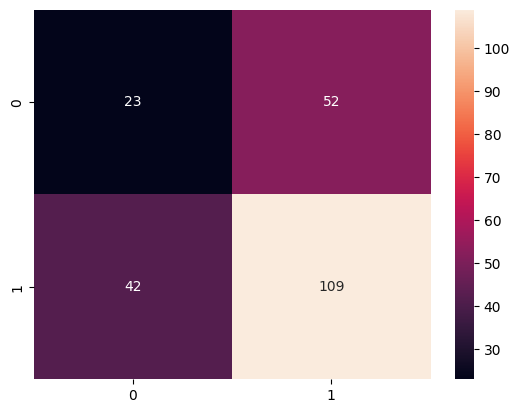


Feature Importance of the model



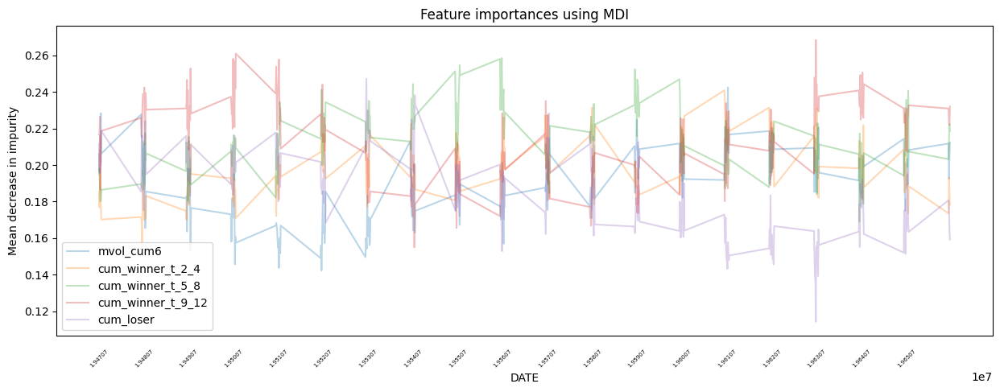

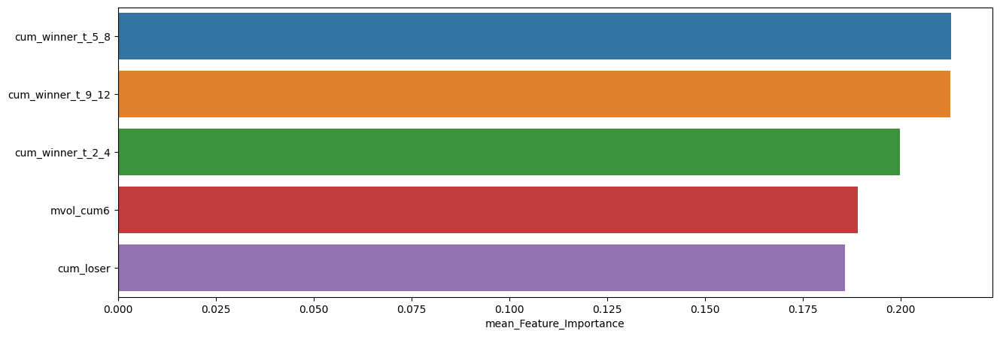

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,0.212792,0.258524,0.169108
cum_winner_t_9_12,0.212590,0.268369,0.154855
cum_winner_t_2_4,0.199857,0.240881,0.155014
mvol_cum6,0.189015,0.242444,0.142203
cum_loser,0.185746,0.247165,0.114214



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.29      0.33        75
         1.0       0.69      0.77      0.73       151

    accuracy                           0.61       226
   macro avg       0.54      0.53      0.53       226
weighted avg       0.59      0.61      0.60       226


accuracy : 0.6106194690265486

precision : 0.6863905325443787

recall : 0.7682119205298014

F1-Score : 0.7250000000000001



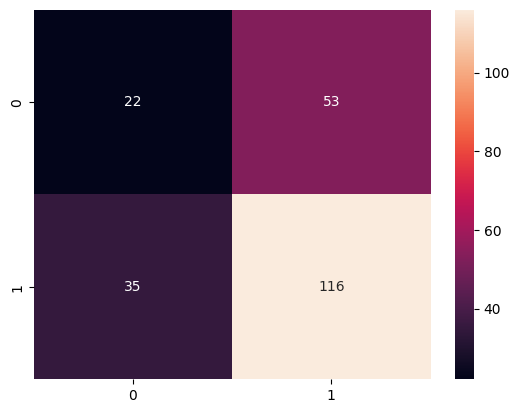


Feature Importance of the model



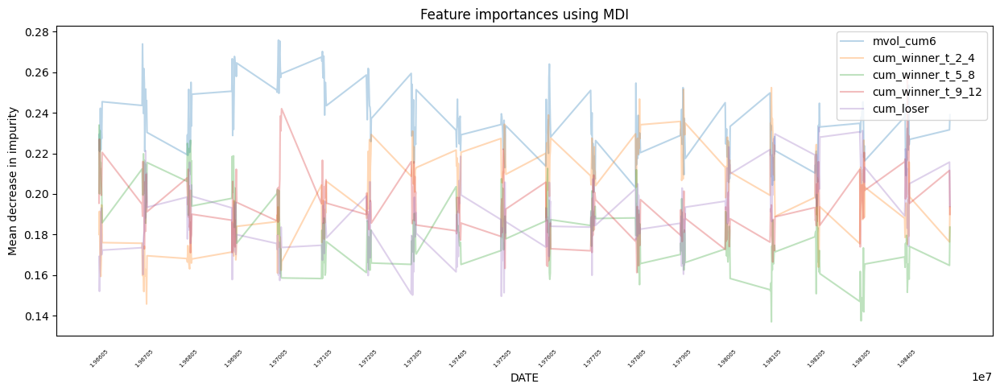

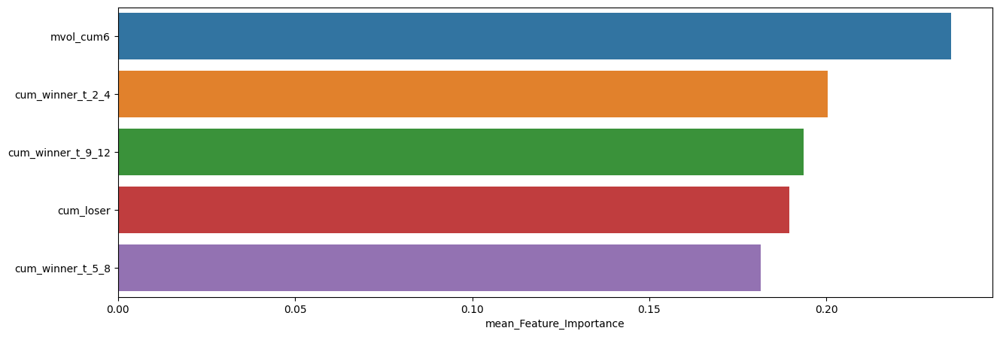

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.235108,0.275848,0.200866
cum_winner_t_2_4,0.200357,0.252403,0.145714
cum_winner_t_9_12,0.193509,0.257908,0.161201
cum_loser,0.189502,0.232870,0.149543
cum_winner_t_5_8,0.181524,0.233831,0.136930



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.33      0.26      0.29        70
         1.0       0.70      0.77      0.73       156

    accuracy                           0.61       226
   macro avg       0.52      0.51      0.51       226
weighted avg       0.58      0.61      0.59       226


accuracy : 0.6106194690265486

precision : 0.6976744186046512

recall : 0.7692307692307693

F1-Score : 0.7317073170731708



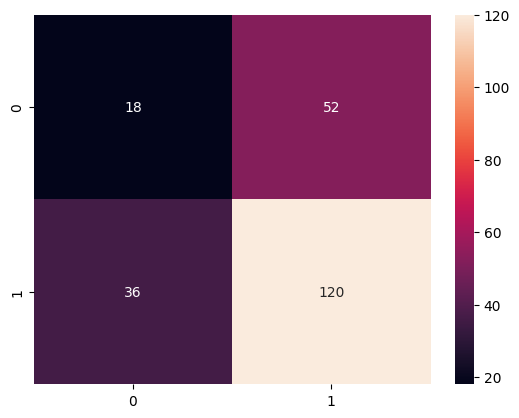


Feature Importance of the model



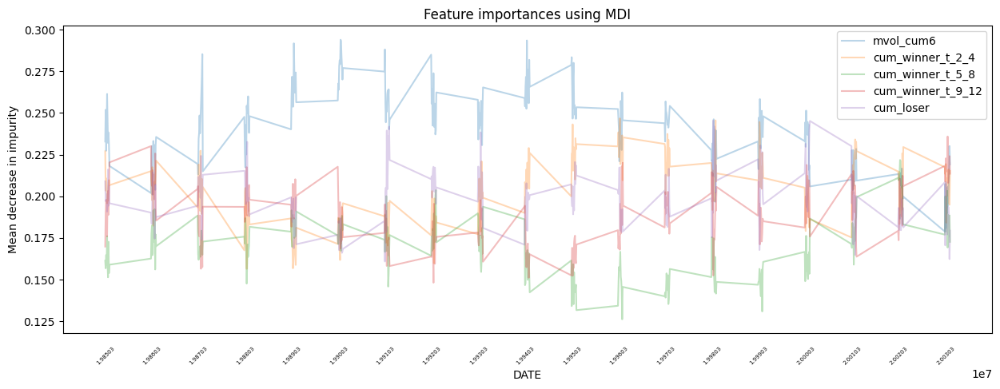

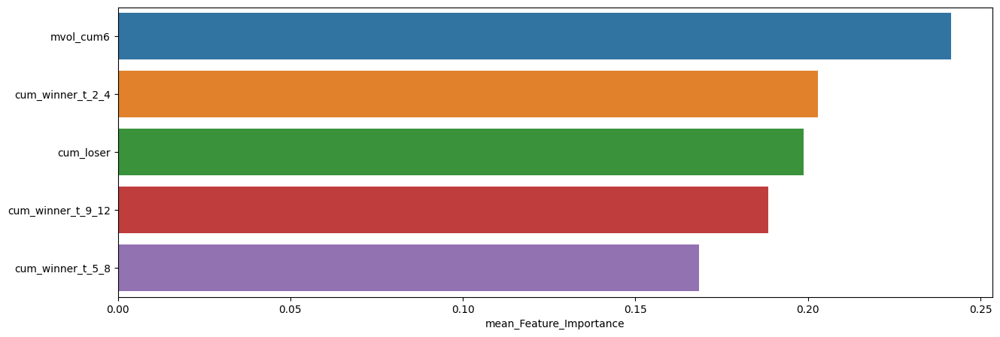

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,0.241442,0.293965,0.178847
cum_winner_t_2_4,0.202944,0.246774,0.156455
cum_loser,0.198692,0.245454,0.160879
cum_winner_t_9_12,0.188445,0.235906,0.148135
cum_winner_t_5_8,0.168477,0.221799,0.126183



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.49      0.31      0.38        96
         1.0       0.60      0.77      0.68       132

    accuracy                           0.57       228
   macro avg       0.55      0.54      0.53       228
weighted avg       0.56      0.57      0.55       228


accuracy : 0.5745614035087719

precision : 0.6047904191616766

recall : 0.7651515151515151

F1-Score : 0.6755852842809364



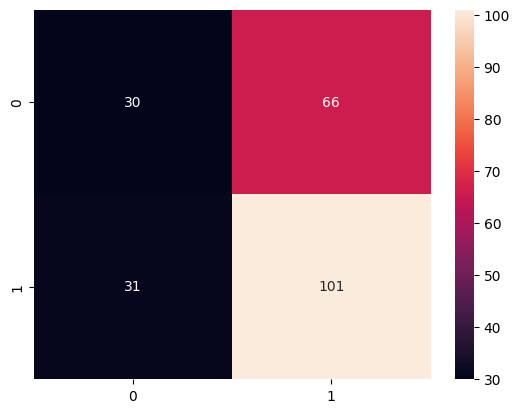


Feature Importance of the model



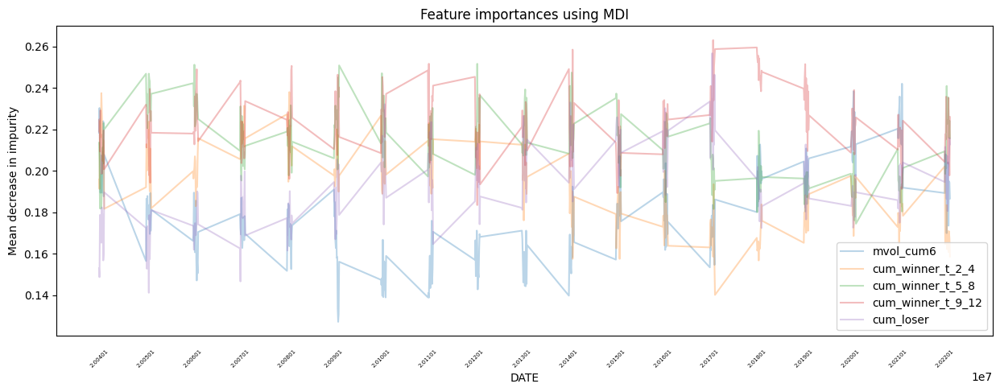

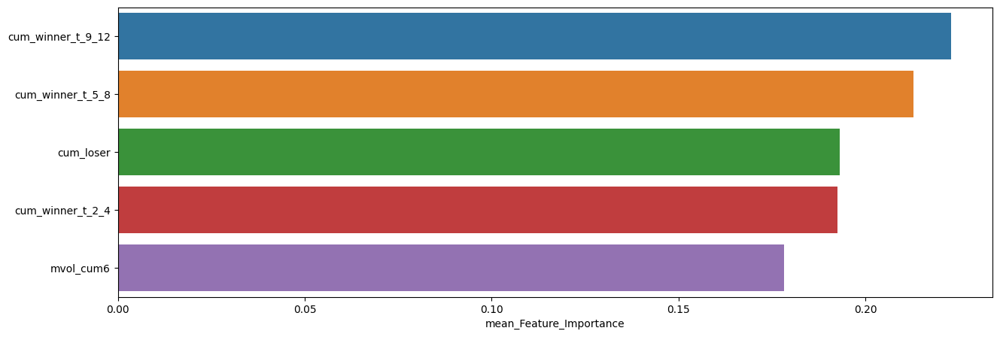

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,0.222897,0.263061,0.183526
cum_winner_t_5_8,0.212977,0.251650,0.174574
cum_loser,0.193196,0.256718,0.141268
cum_winner_t_2_4,0.192629,0.237999,0.140242
mvol_cum6,0.178302,0.242050,0.127251


In [46]:
slice_feature_importance(Fixed_XGB_Result, 4)

## LGBM

In [47]:
LGBM_param = {}
LGBM = LGBMClassifier(**LGBM_param, random_state=42)

In [48]:
Fixed_LGBM_Result = Roling_Windows(data=dynmom, # 사용할 데이터
                                    window_size=240, # window size (훈련 데이터 셋 크기)
                                    method='Fixed', # Rolling Winodw Method (Fixed or Expanding)
                                    model=LGBM) # 사용할 모델

**************************************************
설정된 Model의 하이퍼파리미터 : 

   boosting_type : gbdt
   class_weight : None
   colsample_bytree : 1.0
   importance_type : split
   learning_rate : 0.1
   max_depth : -1
   min_child_samples : 20
   min_child_weight : 0.001
   min_split_gain : 0.0
   n_estimators : 100
   n_jobs : -1
   num_leaves : 31
   objective : None
   random_state : 42
   reg_alpha : 0.0
   reg_lambda : 0.0
   silent : warn
   subsample : 1.0
   subsample_for_bin : 200000
   subsample_freq : 0

**************************************************


  0%|          | 0/906 [00:00<?, ?it/s]

ORG Sharpe Ratio : 0.7293406994683723
ML Sharpe Ratio : 0.6987720834040045


최근 누적 수익률

  2022년-12월 -> 5347.33
  2022년-11월 -> 4900.03
  2022년-10월 -> 4818.32
  2022년-09월 -> 4539.21
  2022년-08월 -> 4338.75

누적 수익률 가장 높았던 순간 Top 10

  1등 : 2009년-02월 -> 6864.57
  2등 : 2008년-11월 -> 6657.92
  3등 : 2009년-01월 -> 6652.40
  4등 : 2008년-12월 -> 6576.18
  5등 : 2002년-09월 -> 6484.99
  6등 : 2008년-10월 -> 6468.93
  7등 : 2008년-06월 -> 6262.78
  8등 : 2008년-09월 -> 6203.76
  9등 : 2008년-07월 -> 6129.64
  10등 : 2008년-08월 -> 6112.81



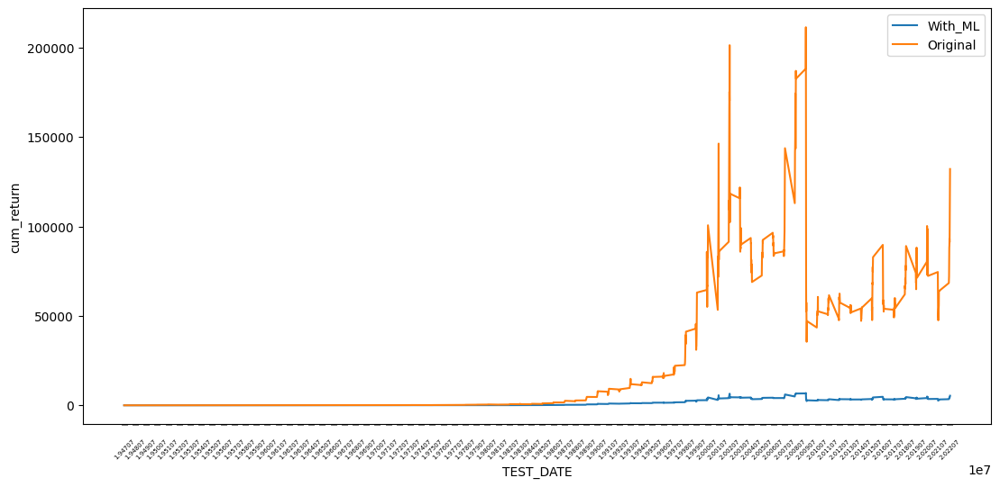

In [49]:
cum_return_sharpe_ratio(data=Fixed_LGBM_Result,
                        dynamic=True)


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.39      0.30      0.34       316
         1.0       0.67      0.75      0.71       590

    accuracy                           0.59       906
   macro avg       0.53      0.53      0.52       906
weighted avg       0.57      0.59      0.58       906


accuracy : 0.5938189845474614

precision : 0.6676737160120846

recall : 0.7491525423728813

F1-Score : 0.7060702875399362



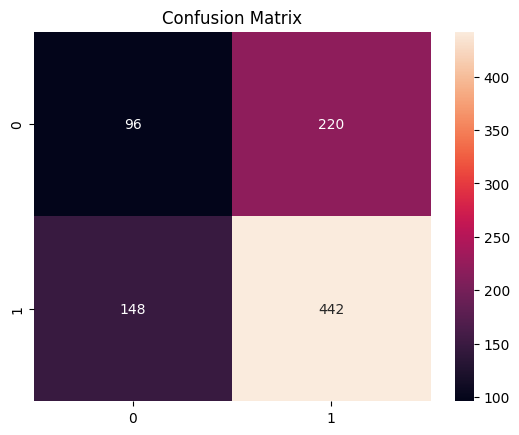


ACTUAL = PRED = 1



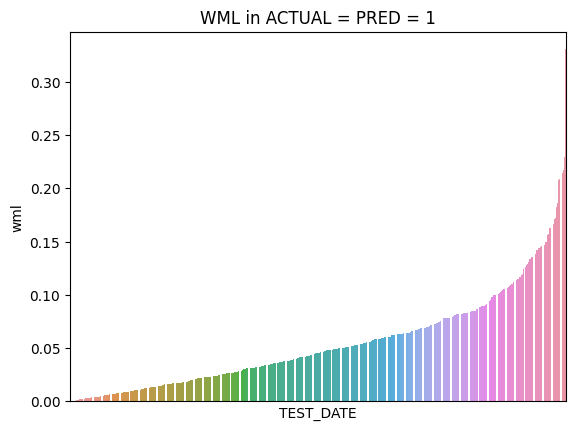

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,442.0,0.054732,0.002093,0.045751,0.000128,0.001031,0.020572,0.045416,0.076584,0.209734,0.330163


,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,442.0,0.043483,0.001396,0.037364,0.000125,0.00093,0.015546,0.034836,0.062807,0.165934,0.318017



--------------------------------------------------------------------------------


ACTUAL = PRED = 0



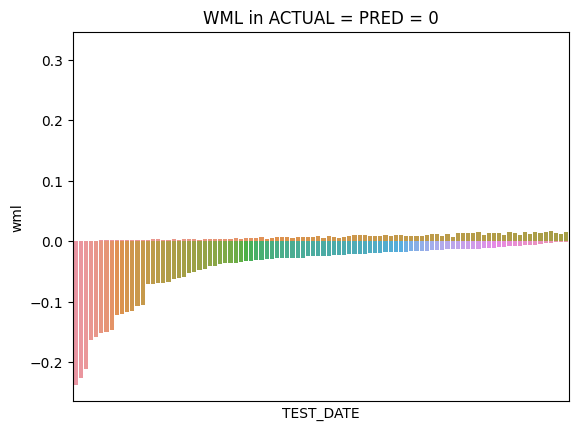

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,96.0,-0.043915,0.00256,0.050597,-0.237095,-0.226253,-0.048544,-0.024243,-0.013792,-0.001623,-0.00129


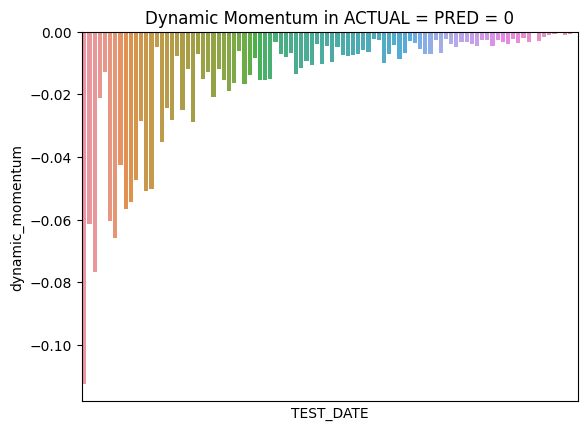

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,96.0,-0.014629,0.000377,0.019426,-0.112505,-0.07845,-0.015277,-0.007146,-0.003409,-0.000501,-0.000428



--------------------------------------------------------------------------------


ACTUAL = 0 & PRED = 1



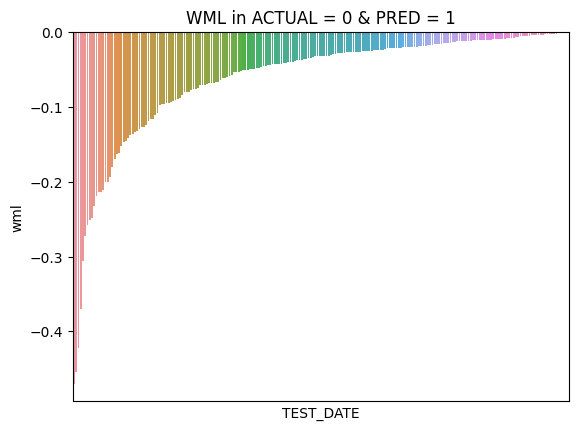

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,220.0,-0.06172,0.006092,0.078049,-0.469903,-0.412452,-0.075377,-0.032352,-0.015304,-0.000592,-0.000132


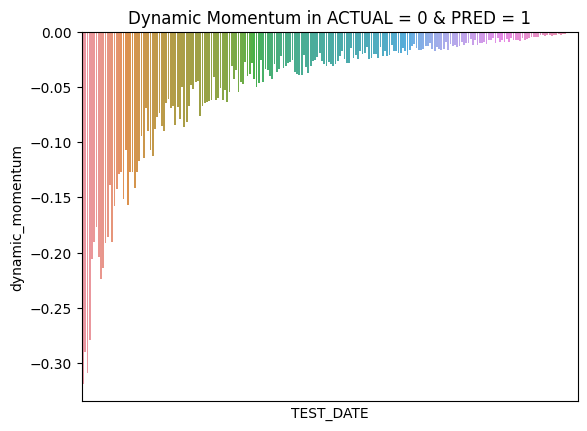

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,220.0,-0.047315,0.00342,0.05848,-0.318989,-0.288376,-0.06112,-0.025577,-0.012062,-0.000492,-0.000121



--------------------------------------------------------------------------------


ACTUAL = 1 &  PRED = 0



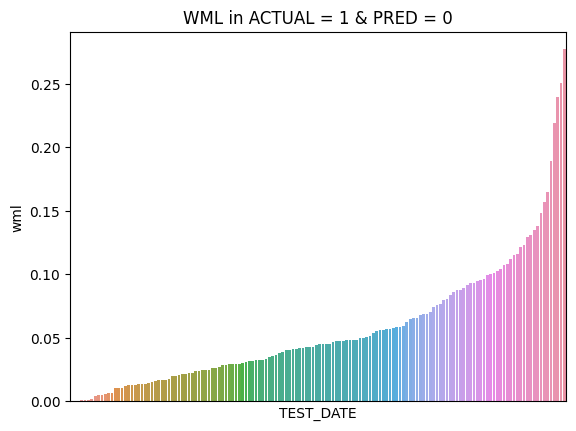

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
wml,148.0,0.056796,0.002497,0.049974,0.000007,0.000601,0.023263,0.044599,0.07738,0.245191,0.276912


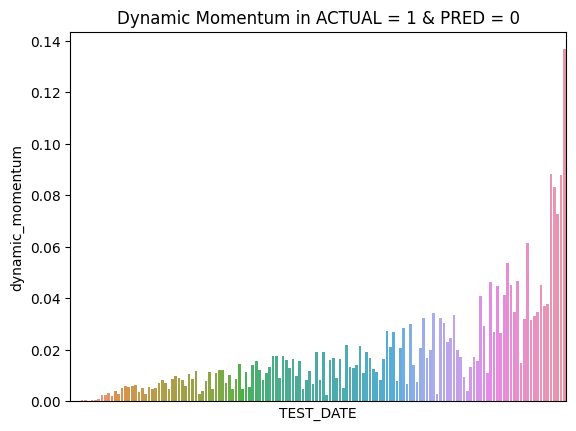

,count,mean,var,std,min,1%,25%,50%,75%,99%,max
dynamic_momentum,148.0,0.0179,0.000371,0.019257,0.000002,0.000127,0.006082,0.012277,0.021128,0.088114,0.136668


In [50]:
plot_predict_result(Fixed_LGBM_Result)


Top 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20000229,19800229,20000131,0.330163,0.318017,1.0,0.963212,1.0,173,174,185,195,145,3784.499945
20200331,20000331,20200228,0.229130,0.206181,1.0,0.899844,1.0,138,180,147,207,198,4896.911130
20010928,19810930,20010831,0.207369,0.186807,1.0,0.900844,1.0,166,205,149,197,153,5623.792233
20150731,19950731,20150630,0.209036,0.174255,1.0,0.833614,1.0,127,154,168,216,200,3793.397681
20000630,19800630,20000531,0.216883,0.168497,1.0,0.776902,1.0,165,173,186,211,157,3390.380925



Bottom 5 dyn_mom



,TRAIN_START_DATE,TRAIN_END_DATE,wml,dynamic_momentum,Actual_POS_WML,dynamic_leverage,static_leverage,mvol_cum6,cum_winner_t_2_4,cum_winner_t_5_8,cum_winner_t_9_12,cum_loser,cum_return
TEST_DATE,,,,,,,,,,,,,
20010131,19810130,20001229,-0.469903,-0.318989,0.0,0.678841,1.0,192,190,136,208,156,2993.757274
20090331,19890331,20090227,-0.422400,-0.309421,0.0,0.732531,1.0,140,185,208,187,155,4740.215455
20090430,19890428,20090331,-0.454349,-0.290545,0.0,0.639474,1.0,131,173,239,170,158,3362.680813
20021129,19821130,20021031,-0.370041,-0.279130,0.0,0.754322,1.0,165,174,150,198,173,4071.470418
20201130,20001130,20201030,-0.248070,-0.224146,0.0,0.903559,1.0,147,155,162,203,203,3579.670487


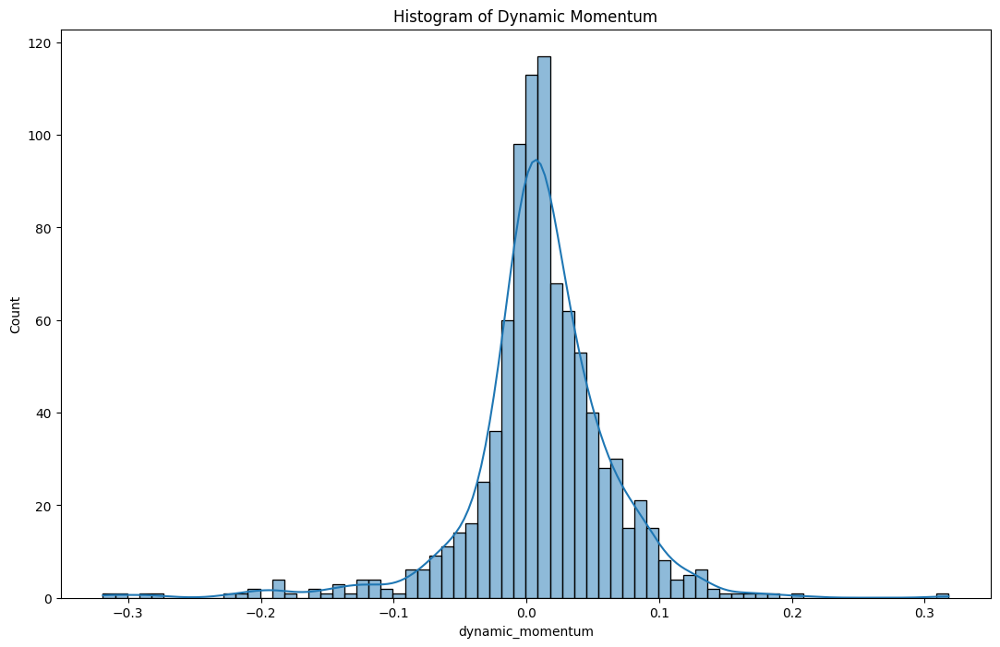

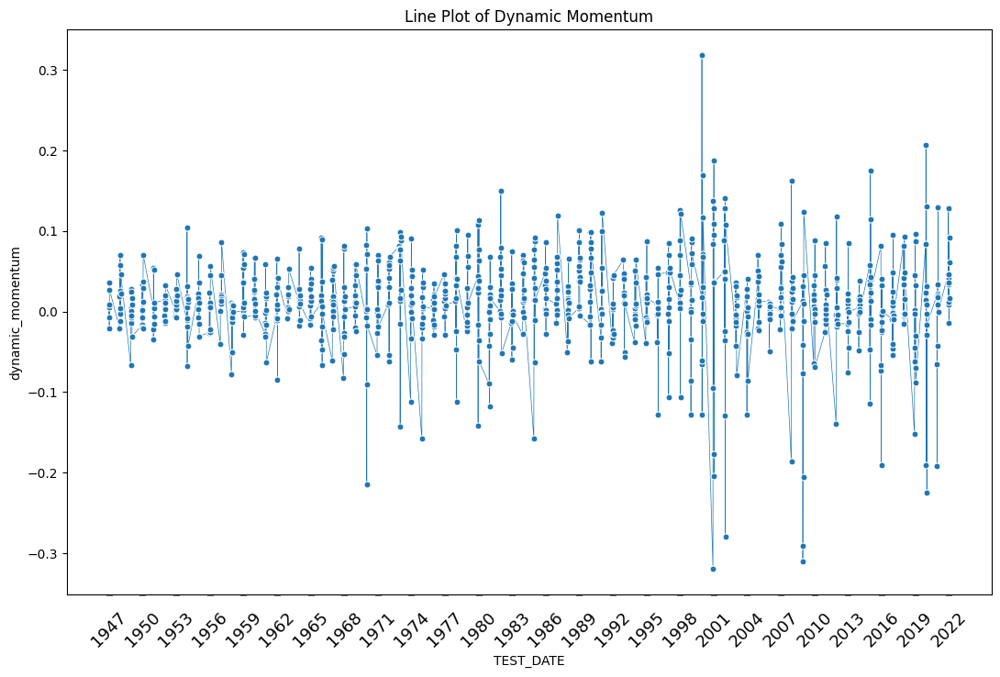

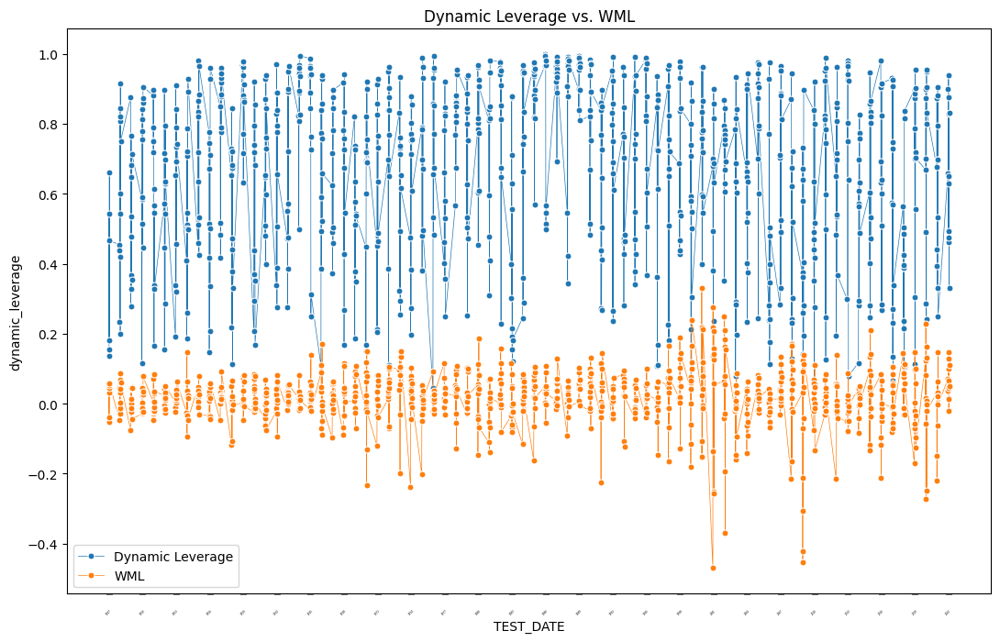

In [51]:
plot_dynamic_momentum(Fixed_LGBM_Result)

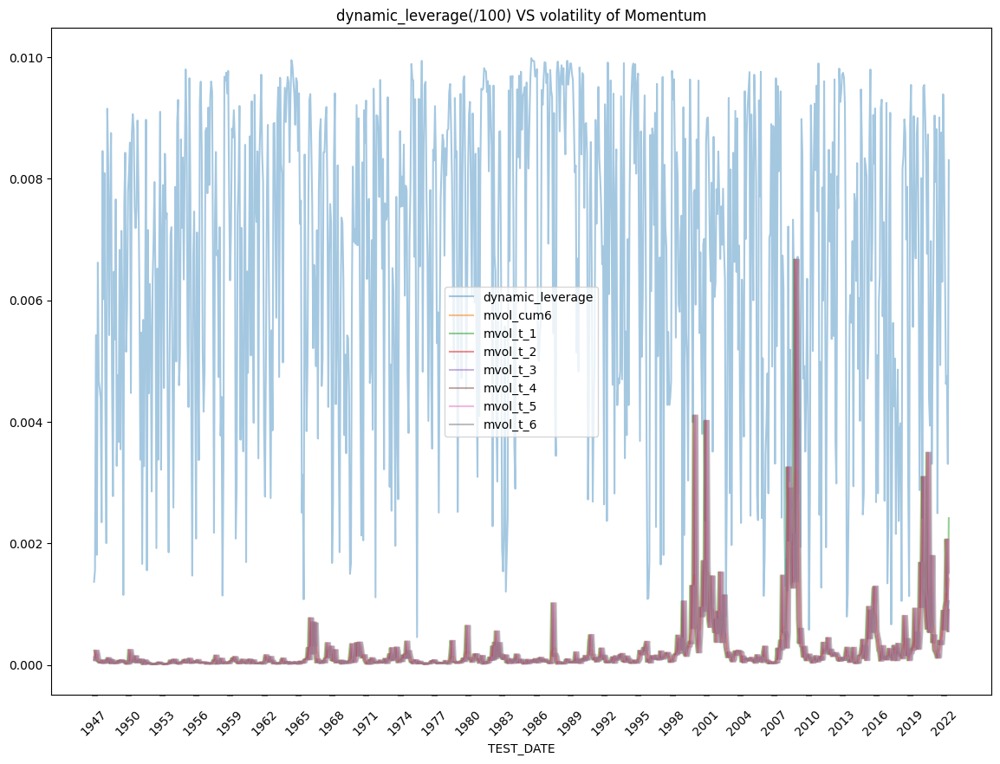

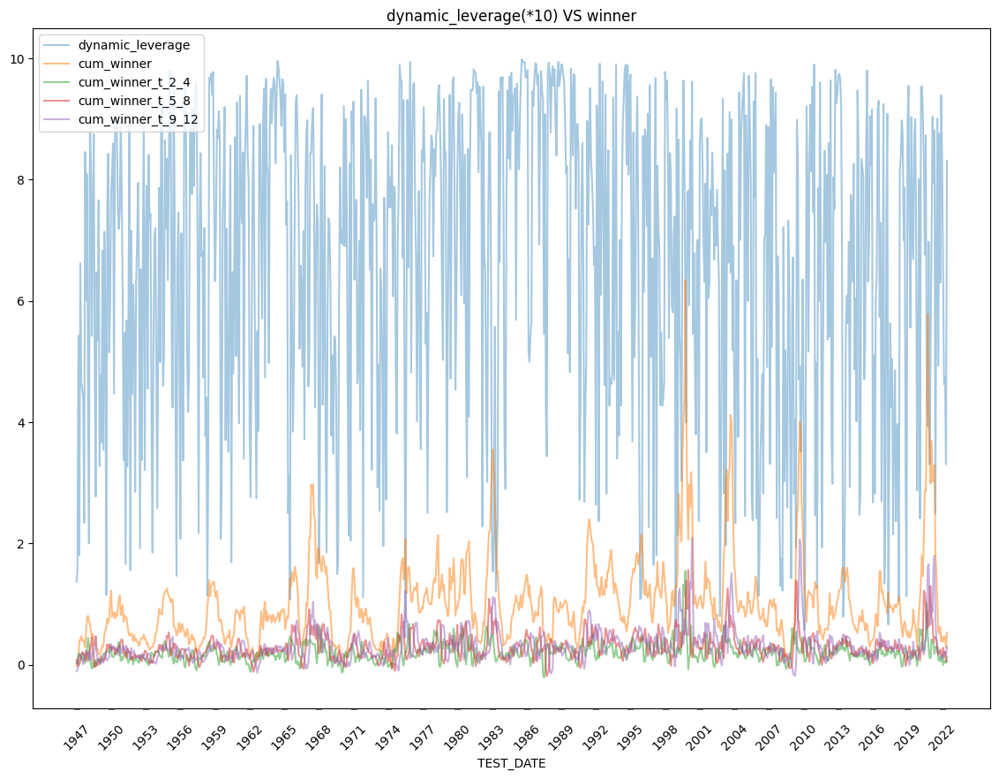

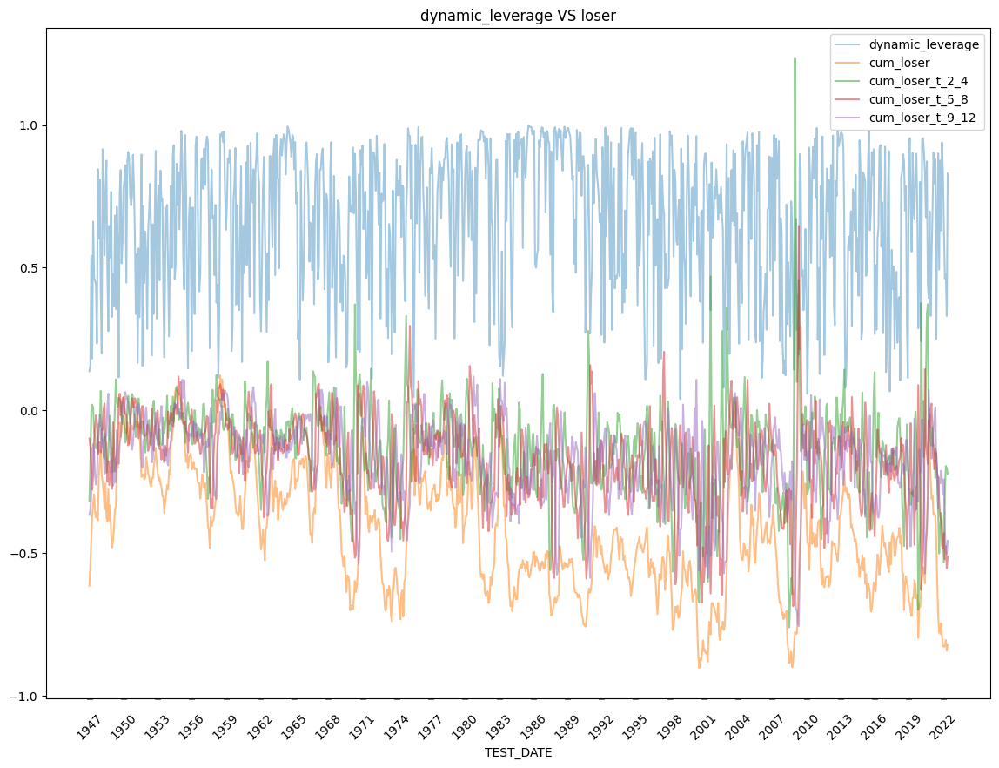

In [55]:
save_LGBM = leverage_save(Fixed_LGBM_Result, DATA)
save_LGBM.to_csv(f'/content/drive/MyDrive/Fin_AI/save_data/csv/Tree/LGBM_{case_name}.csv')



Feature Importance of the model



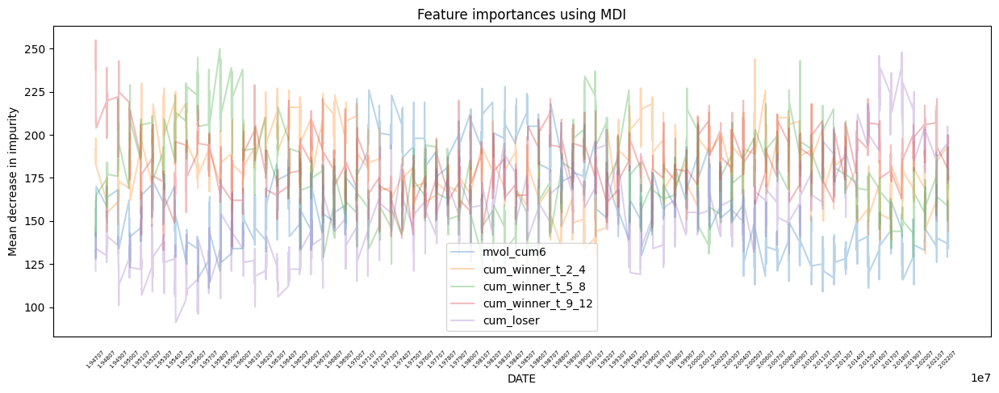

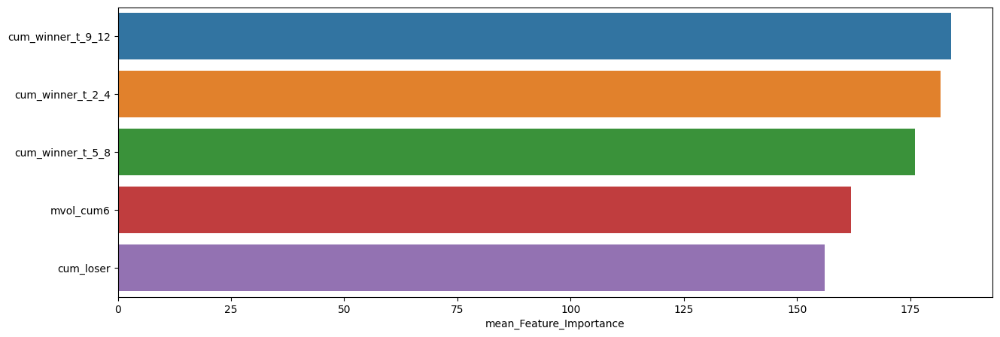

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,183.970199,255,133
cum_winner_t_2_4,181.622517,244,130
cum_winner_t_5_8,175.982340,250,112
mvol_cum6,161.985651,228,109
cum_loser,156.136865,248,91


In [53]:
plot_feature_importances(Fixed_LGBM_Result)


**************************************************

DATE : 19470731 ~ 19660429

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.37      0.32      0.34        75
         1.0       0.68      0.73      0.71       151

    accuracy                           0.59       226
   macro avg       0.53      0.52      0.52       226
weighted avg       0.58      0.59      0.58       226


accuracy : 0.5929203539823009

precision : 0.6832298136645962

recall : 0.7284768211920529

F1-Score : 0.7051282051282051



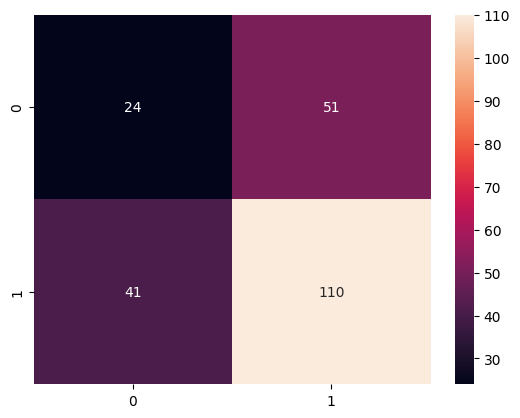


Feature Importance of the model



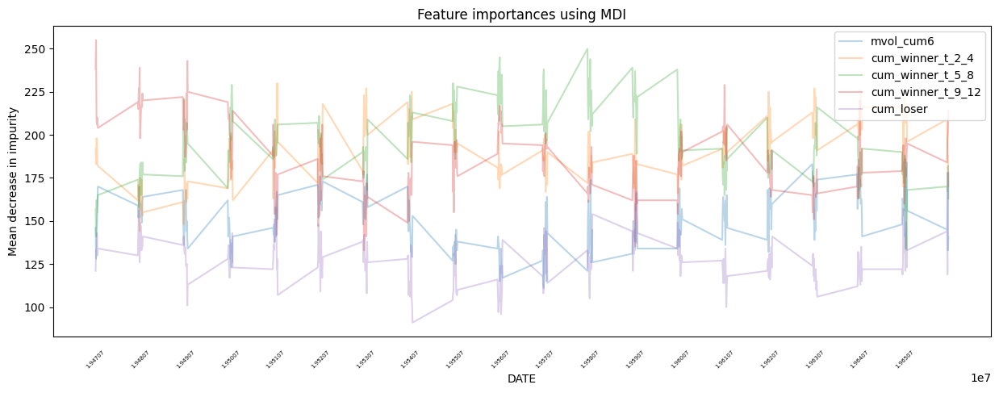

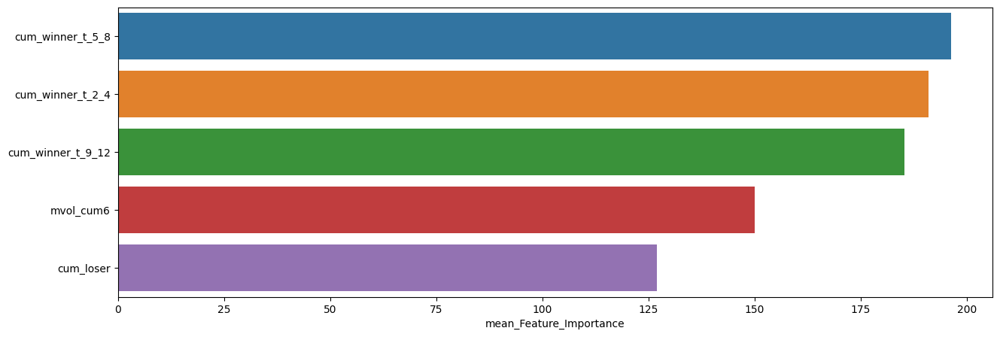

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_5_8,196.287611,250,133
cum_winner_t_2_4,190.986726,230,144
cum_winner_t_9_12,185.327434,255,133
mvol_cum6,150.097345,186,111
cum_loser,127.053097,178,91



**************************************************

DATE : 19660531 ~ 19850228

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.41      0.31      0.35        75
         1.0       0.69      0.78      0.74       151

    accuracy                           0.62       226
   macro avg       0.55      0.54      0.54       226
weighted avg       0.60      0.62      0.61       226


accuracy : 0.6238938053097345

precision : 0.6941176470588235

recall : 0.7814569536423841

F1-Score : 0.735202492211838



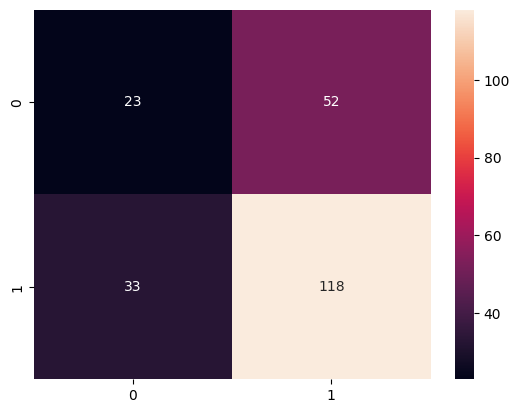


Feature Importance of the model



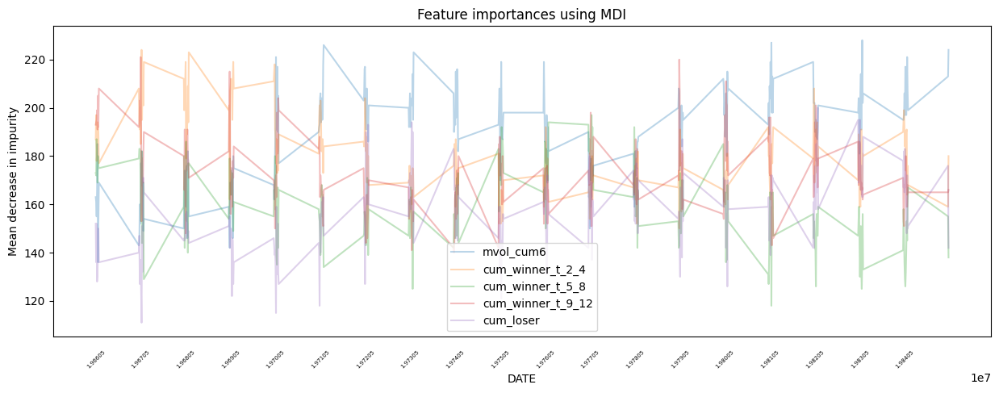

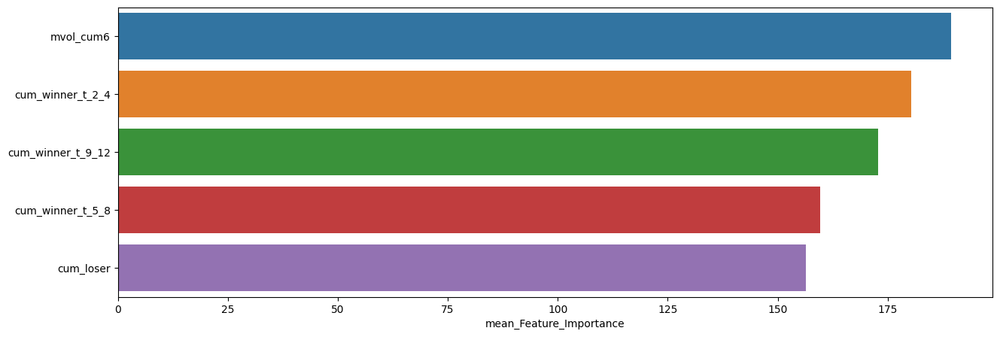

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
mvol_cum6,189.376106,228,136
cum_winner_t_2_4,180.323009,224,150
cum_winner_t_9_12,172.853982,221,140
cum_winner_t_5_8,159.619469,197,118
cum_loser,156.464602,200,111



**************************************************

DATE : 19850329 ~ 20031231

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.32      0.20      0.25        70
         1.0       0.69      0.81      0.75       156

    accuracy                           0.62       226
   macro avg       0.51      0.50      0.50       226
weighted avg       0.58      0.62      0.59       226


accuracy : 0.6194690265486725

precision : 0.6923076923076923

recall : 0.8076923076923077

F1-Score : 0.7455621301775147



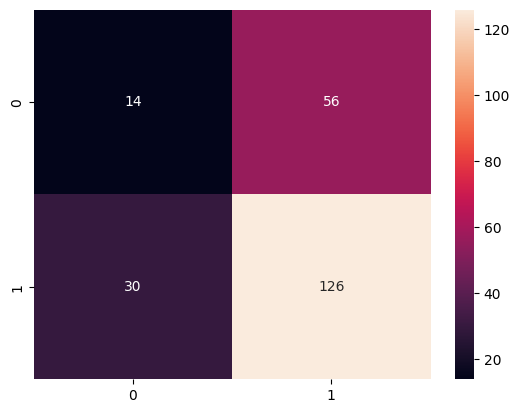


Feature Importance of the model



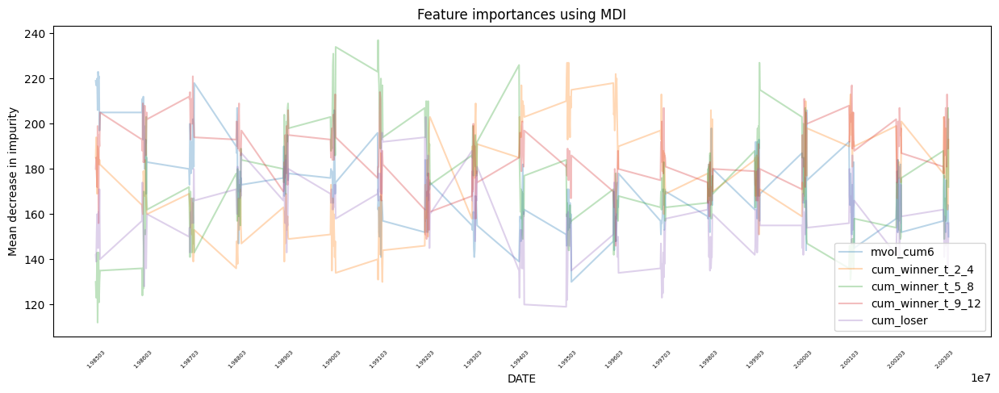

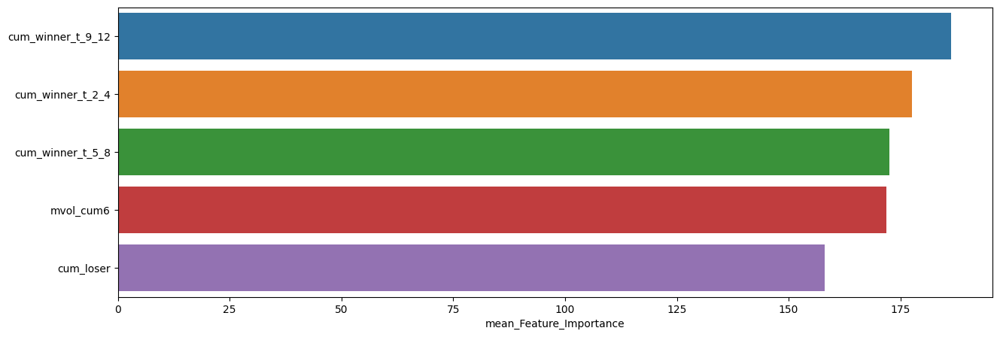

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,186.278761,221,146
cum_winner_t_2_4,177.553097,227,130
cum_winner_t_5_8,172.446903,237,112
mvol_cum6,171.889381,223,130
cum_loser,158.035398,203,119



**************************************************

DATE : 20040130 ~ 20221230

**************************************************


Performance results of the model

              precision    recall  f1-score   support

         0.0       0.44      0.36      0.40        96
         1.0       0.59      0.67      0.63       132

    accuracy                           0.54       228
   macro avg       0.52      0.52      0.51       228
weighted avg       0.53      0.54      0.53       228


accuracy : 0.5394736842105263

precision : 0.5906040268456376

recall : 0.6666666666666666

F1-Score : 0.6263345195729538



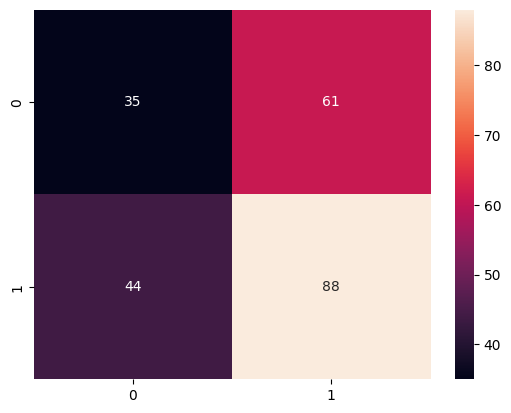


Feature Importance of the model



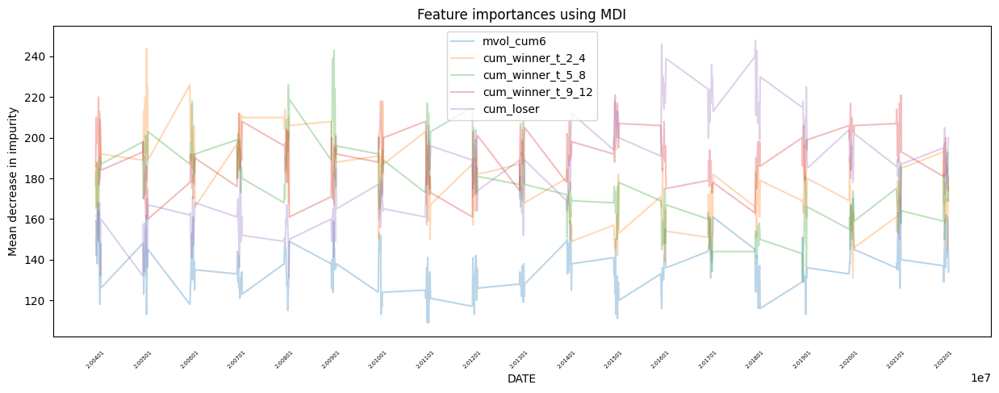

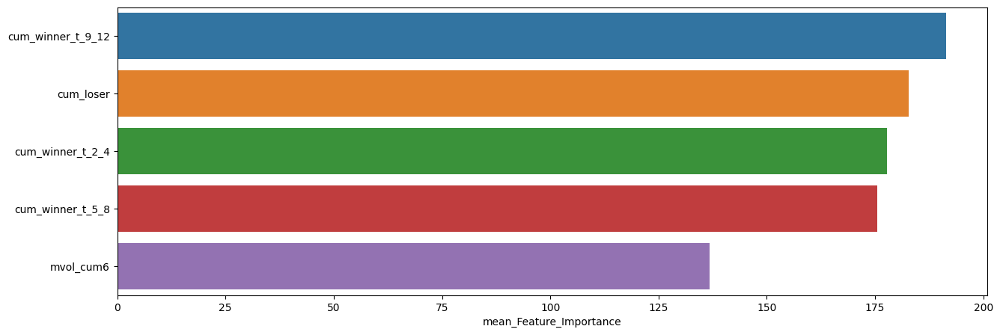

,mean_Feature_Importance,max_Feature_Importance,min_Feature_Importance
cum_winner_t_9_12,191.355263,221,160
cum_loser,182.758772,248,131
cum_winner_t_2_4,177.662281,244,131
cum_winner_t_5_8,175.578947,243,129
mvol_cum6,136.802632,171,109


In [54]:
slice_feature_importance(Fixed_LGBM_Result, 4)

# Compare

## F1 Score

RDF의 F1-Score : 0.7197549770290964
GBC의 F1-Score : 0.7134052388289676
XGB의 F1-Score : 0.7084988085782367
LGBM의 F1-Score : 0.7060702875399362



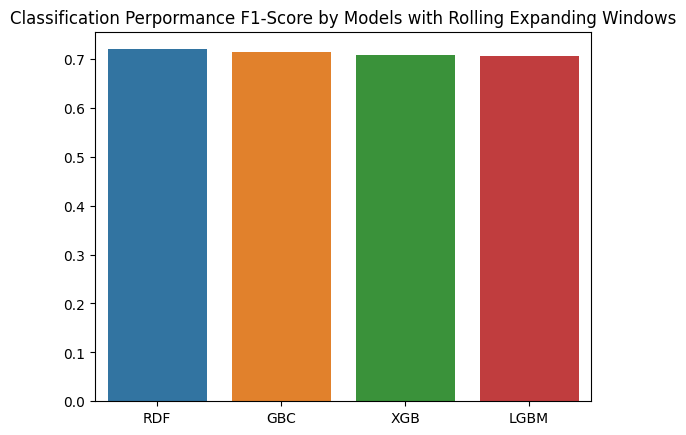

In [62]:
list_model = ['RDF', 'GBC', 'XGB', 'LGBM']
list_result = [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result]

list_f1 = []

for model, data in zip(list_model, list_result):
  F1 = f1_score(data['Actual_POS_WML'], data[f'static_leverage'])
  print(f'{model}의 F1-Score : {F1}')
  list_f1.append(F1)
print()

sns.barplot(x=list_model, y=list_f1)
plt.title('Classification Perpormance F1-Score by Models with Rolling Expanding Windows')
plt.show()

## Cum Return & Sharpe Ratio

In [60]:
def compare_sharpe_ratio(list_model, list_result):

    for model, data in zip(list_model, list_result):

      S = (data['dynamic_momentum'].mean()/data['dynamic_momentum'].std())*math.sqrt(12)
      C = list(data['cum_return'])[-1]
      print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format(model, S, C))

      sns.lineplot(data=data, x=data.index, y='cum_return', alpha=0.7, label=model)

    CUM_WML = data[['wml']]
    CUM_WML['cum_return'] = (1 + CUM_WML.wml).cumprod() - 1

    org_S = (CUM_WML['wml'].mean()/CUM_WML['wml'].std())*math.sqrt(12)
    org_C = list(CUM_WML['cum_return'])[-1]
    print()
    print('{} Sharpe Ratio : {:0.4f}  최종 누적 수익률 : {}'.format('ORG', org_S, org_C))
    print()

    sns.lineplot(data=CUM_WML, x=CUM_WML.index, y='cum_return', alpha=0.7, label='ORG')
    plt.title('Sharpe Ratio & Cum Return by Model')
    plt.xticks([CUM_WML.index[i] for i in range(0, len(CUM_WML.index), 36)],
              labels=[str(CUM_WML.index[i])[:4] for i in range(0, len(CUM_WML.index), 36)])
    plt.tick_params(axis='x',
                      direction='out',
                      labelrotation=45,
                      length=1,
                      pad=10,
                      labelsize=10,
                      width=0.1)
    plt.show()

RDF Sharpe Ratio : 0.7457  최종 누적 수익률 : 5279.815756822656
GBC Sharpe Ratio : 0.7415  최종 누적 수익률 : 8147.678339593288
XGB Sharpe Ratio : 0.6971  최종 누적 수익률 : 8577.599046589497
LGBM Sharpe Ratio : 0.6988  최종 누적 수익률 : 5347.32938595278

ORG Sharpe Ratio : 0.7293  최종 누적 수익률 : 132103.15024526353



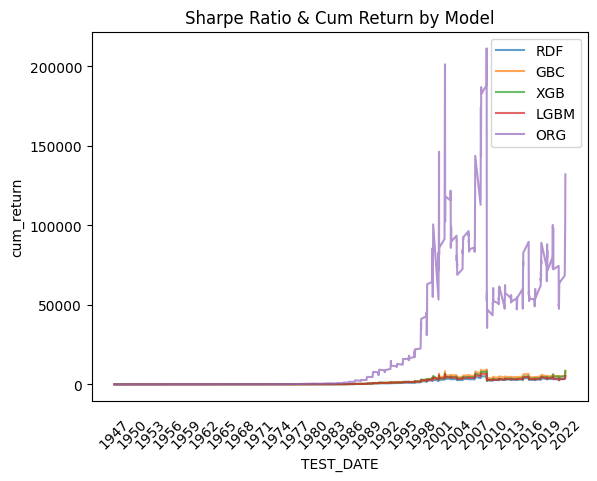

In [61]:
compare_sharpe_ratio(['RDF', 'GBC', 'XGB', 'LGBM'],
                     [Fixed_RDF_Result, Fixed_GBC_Result, Fixed_XGB_Result, Fixed_LGBM_Result])